In [1]:

from sys import path
path.insert(0, '/Users/h/Github/geo_data_group/')
import data_year as dy
import grid_set as gs
import numpy as np
from netCDF4 import Dataset
import matplotlib.pyplot as plt
# from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import glob
import datetime as dt
from dateutil.relativedelta import relativedelta
import gc
import copy
from imp import reload
import budget_analysis as ba
import budget_accum as b
reload(dy)
reload(ba)
reload(gs)

<module 'grid_set' from '/Users/h/Github/geo_data_group/grid_set.py'>

In [2]:

### SET the grid for the output data
### You 'should' be able to change the projecton here

# m = Basemap(projection='npstere',boundinglat=65,lon_0=0)
m = ccrs.LambertAzimuthalEqualArea(central_latitude=90)
G = gs.grid_set(m)
G.load_grid('grids/Pathfinder_gs.npz')
# G.load_mask('grids/Pathfinder_gs_mask.npz')
# G.load_grid('grids/osisaf_455_gs.npz')
# G.load_grid('grids/osisaf_gs2.npz')
# G.load_mask('grids/osisaf_gs_mask2.npz')
# G.load_grid('grids/PIOMAS_gs.npz')
# G.load_mask('grids/PIOMAS_gs_mask.npz')
# G1 = gs.grid_set(m)
# G1.load_grid('grids/osisaf_gs2.npz')
# G1.load_mask('grids/osisaf_gs_mask2.npz')
G.get_grid_mask()

Loaded a grid: grids/Pathfinder_gs.npz


In [3]:
G.mask[G.lats>87.4] = np.nan

In [95]:

### SET the grid for the output data
### You 'should' be able to change the projecton here

# m = Basemap(projection='npstere',boundinglat=65,lon_0=0)
m = ccrs.LambertAzimuthalEqualArea(central_latitude=90)
G = gs.grid_set(m)
G2 = gs.grid_set(m)
G.load_grid('grids/Pathfinder_gs.npz')
G.load_mask('grids/Pathfinder_gs_mask.npz')
# G.load_grid('grids/osisaf_gs2.npz')
# G.load_mask('grids/osisaf_gs_mask2.npz')
G2.load_grid('grids/osisaf_455_gs.npz')
G2.get_grid_mask()
# G2.load_mask('grids/osisaf_gs_mask2.npz')
# G2.load_grid('grids/PIOMAS_gs.npz')
# G2.load_mask('grids/PIOMAS_gs_mask.npz')
# G1 = gs.grid_set(m)
# G1.load_grid('grids/osisaf_gs2.npz')
# G1.load_mask('grids/osisaf_gs_mask2.npz')


Loaded a grid: grids/Pathfinder_gs.npz
Loaded mask,  361  x  361  inflated by  0.0
Loaded a grid: grids/osisaf_455_gs.npz


In [96]:
f = plt.figure()
Gplot= gs.grid_set(m)

ax = f.add_subplot(1,1,1,projection=m)
ax.set_extent([-180, 180, 50, 90], ccrs.PlateCarree())
Gplot.set_grid_mn(30,30,ax)
Gplot.get_grid_info(av_ang=False)
plt.close()

G2Gplot= gs.Gs2Gs(G,Gplot,vectors=True)

Got a grid res =  30  x  30
Grid distances calculated:  301608.63737844786  x  301196.8593246297
Angles calculated


In [6]:
m = ccrs.LambertAzimuthalEqualArea(central_latitude=90)
Gates_list = ba.load_gate_grids('./grids/Gate_grids/',m,old_list=True)
# Gates_list = ba.load_gates('./grids/Gate_grids/',m)

Loaded a grid: ./grids/Gate_grids/Gate_Fram.npz
Loaded mask,  33  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BarentsBot.npz
Loaded mask,  39  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BarentsTop.npz
Loaded mask,  35  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_KaraTop.npz
Loaded mask,  31  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_KaraBot.npz
Loaded mask,  24  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Chukchi.npz
Loaded mask,  10  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BaffinTop.npz
Loaded mask,  26  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_BaffinBot.npz
Loaded mask,  22  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Central_east.npz
Loaded mask,  84  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Central_west.npz
Loaded mask,  65  x  2  inflated by  0.0
Loaded a grid: ./grids/Gate_grids/Gate_Chukchi_Beaufort.npz
Loa

In [203]:
#### HERE WE SET THE OUTPUT DATA
## The directory should be full of the budfeilds files from the budget process tool
## monthlies only

# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2021_06_30/out_PIOMAS_smooth/'
# save_dir = '/Users/h/PREMELT/Budget/Budget_tool/Cov_tests/'
save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_smooth/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_Pathfinder_nt_Bristol_full_year/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/'
# bud1 = ba.budget_result(save_dir,year_limit=[2010,2022],
budM1 = ba.budget_result(save_dir,year_limit=[2013,2016],
#                         daily=True,
        var_load=['intensification','advection','divergence','residual',
                 'ice_drift_x','ice_drift_y','concentration','thickness','dynamics',
                 'div_t','adv_t','int_t','res_t','dyn_t','new_ice','old_ice',
                  'div_sig','adv_sig','int_sig','res_sig','dyn_sig',
                  'Vol_sig','U_sig','V_sig',
                 ],
            ignore_file = [
#                 'budfields_20101014--20101101.nc',
            ]
                       )
# test_bud = ba.budget_result_monthly(save_dir)

In [187]:
save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/'
Gate_data1 = ba.load_gates(save_dir,Gates_list[:],year_limit=[2012,2022],
        var_load=['transport_x','transport_y',#'ice_drift_x','ice_drift_y',
                  'trans_x_sig','trans_y_sig',],
                           daily=True,
            ignore_file = [
#                 'budfields_20101014--20101101.nc',
            ]
                          )

In [164]:
Gate_data1[0].load_files[-4:]

['/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/Gate_Fram/budfields_20150928--20150929.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/Gate_Fram/budfields_20150929--20150930.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/Gate_Fram/budfields_20150930--20151001.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/Gate_Fram/budfields_20151001--20151002.nc']

In [156]:
bud1.load_files[-4:]
# bud2.load_files[:3],bud2.dates[:3]

['/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/budfields_20150928--20150929.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/budfields_20150929--20150930.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/budfields_20150930--20151001.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/budfields_20151001--20151002.nc']

In [170]:
#### HERE WE SET THE OUTPUT DATA
## The directory should be full of the budfeilds files from the budget process tool
## monthlies only

# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2021_06_30/out_PIOMAS_smooth/'
# save_dir = '/Users/h/PREMELT/Budget/Budget_tool/Cov_tests/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_smooth/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_08_17/out_OSISAF_nt_Bristol_full_smooth/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_Pathfinder_nt_Bristol_full_year/'
save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_OSISAF_nt_Bristol_full_year_daily/'
# save_dir = '/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_daily_smooth/'
bud2 = ba.budget_result(save_dir,year_limit=[2010,2021],
                        daily=True,
        var_load=['intensification','advection','divergence','residual',
                 'ice_drift_x','ice_drift_y','concentration','thickness','dynamics',
                 'div_t','adv_t','int_t','res_t','dyn_t','new_ice','old_ice',
#                   'div_sig','adv_sig','int_sig','res_sig','dyn_sig',
#                   'Vol_sig','U_sig','V_sig',
                 ],
            ignore_file = [
#                 'budfields_20101014--20101101.nc',
            ]
                       )
# test_bud = ba.budget_result_monthly(save_dir)

In [205]:
# budM1.MIZ = budM1.old_ice + budM1.new_ice + budM1.int_t
bud1.MIZ = bud1.old_ice + bud1.new_ice + bud1.int_t
# bud2.MIZ = bud2.old_ice + bud2.new_ice + bud2.int_t

In [165]:
Gate_data2 = ba.load_gates(save_dir,Gates_list[:],year_limit=[2012,2021],
        var_load=['transport_x','transport_y',#'ice_drift_x','ice_drift_y',
#                   'trans_x_sig','trans_y_sig',
                 ],
                           daily=True,
            ignore_file = [
                'budfields_20101014--20101101.nc',
            ]
                          )

In [166]:

Gate_data2[0].load_files[-4:]

['/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_OSISAF_nt_Bristol_full_year_daily/Gate_Fram/budfields_20150927--20150928.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_OSISAF_nt_Bristol_full_year_daily/Gate_Fram/budfields_20150928--20150929.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_OSISAF_nt_Bristol_full_year_daily/Gate_Fram/budfields_20150929--20150930.nc',
 '/Users/h/PREMELT/Budget/Outputs/Outputs_2023_11_01/out_OSISAF_nt_Bristol_full_year_daily/Gate_Fram/budfields_20150930--20151001.nc']

In [35]:
# ### Force add the thin ice terms
# msk = np.isfinite(bud1.int_t)
# bud1.intensification[msk] += bud1.int_t[msk]
# msk = np.isfinite(bud1.div_t)
# bud1.divergence[msk] += bud1.div_t[msk]
# msk = np.isfinite(bud1.adv_t)
# bud1.advection[msk] += bud1.adv_t[msk]
# msk = np.isfinite(bud1.res_t)
# bud1.residual[msk] += bud1.res_t[msk]

In [188]:
bud1.n_t,Gate_data1[0].n_t,bud2.n_t,Gate_data2[0].n_t,

(397, 397, 364, 364)

In [186]:
bud1.dates[-20:]
Gate_data1[0].dates[:20]

[datetime.datetime(2010, 10, 31, 0, 0),
 datetime.datetime(2010, 11, 1, 0, 0),
 datetime.datetime(2010, 12, 1, 0, 0),
 datetime.datetime(2014, 8, 31, 0, 0),
 datetime.datetime(2014, 9, 1, 0, 0),
 datetime.datetime(2014, 9, 2, 0, 0),
 datetime.datetime(2014, 9, 3, 0, 0),
 datetime.datetime(2014, 9, 4, 0, 0),
 datetime.datetime(2014, 9, 5, 0, 0),
 datetime.datetime(2014, 9, 6, 0, 0),
 datetime.datetime(2014, 9, 7, 0, 0),
 datetime.datetime(2014, 9, 8, 0, 0),
 datetime.datetime(2014, 9, 9, 0, 0),
 datetime.datetime(2014, 9, 10, 0, 0),
 datetime.datetime(2014, 9, 11, 0, 0),
 datetime.datetime(2014, 9, 12, 0, 0),
 datetime.datetime(2014, 9, 13, 0, 0),
 datetime.datetime(2014, 9, 14, 0, 0),
 datetime.datetime(2014, 9, 15, 0, 0),
 datetime.datetime(2014, 9, 16, 0, 0)]

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:55: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:56: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:65: RuntimeWarning: Mean of empty slice


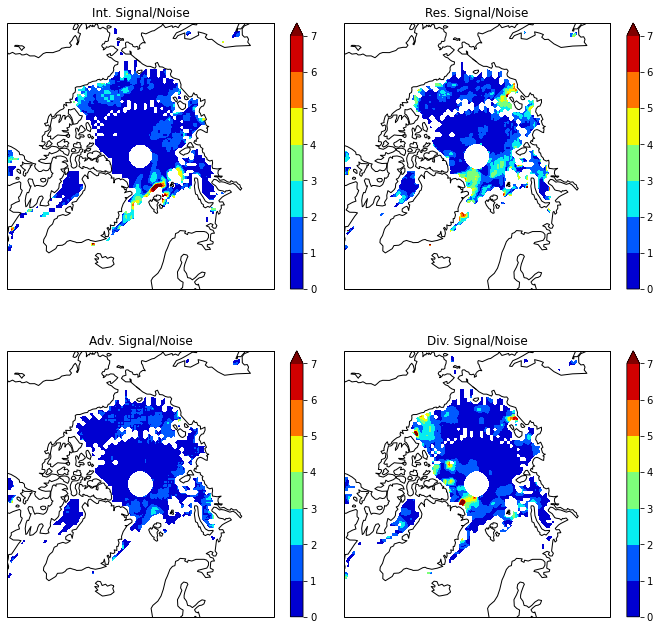

In [478]:
#### Signal to noise average for Inputs
## time to plot
t=slice(10,200)
# t=slice(100,101)
t_no=122
t_no=160
t=slice(t_no,t_no+1)
points = [[-30,75],[120,75],[0,90]] ## central barents
# points = [[0,75],[60,75],[0,86]] ### zoom barents edge #### force map to include these points
# points = [[-175,72],[-140,68],[-160,86]] ## Beaufort ish
lims = G.lims_from_lonlat(points,for_extent = True)
# # t=slice(6,12)
# # tlist = [slice(0,6),slice(6,12)]
# # labels = ['Growth','Melt']
# # tlist = [slice(t,t+1) for t in range(6)]
# tlist = [slice(t,t+1) for t in range(6,12)]
# labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
# fig = plt.figure(figsize=(5*len(tlist),5))
# for pn,(t,lab) in enumerate(zip(tlist,labels)):
#     ax = fig.add_subplot(1,len(tlist),pn+1,projection=m)
#     ax = ba.plot_single(np.nanmean(bud1.old_ice[t]+bud1.new_ice[t],axis = 0),np.arange(-0.1,0.11,0.01),G,
#                         vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
#                         vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
#                         rvGplot=G2Gplot,return_ax = True,give_ax=ax,
#                         label='new/old ice (m)',cmap = plt.cm.RdBu)
#     ax.set_title(lab)
# fig.subplots_adjust(hspace=0.05,wspace=0.02)
# fig.savefig(save_dir+'new_old_ice_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
# fig.show()

# points = [[-30,75],[120,75],[0,90]] ## central barents
# points = [[0,75],[60,75],[0,86]] ### zoom barents edge #### force map to include these points
# points = [[-175,72],[-140,68],[-160,86]] ## Beaufort ish
# lims = GV.lims_from_lonlat(points,for_extent = True)
lmax = 8.0
level_list = [
    np.arange(0.0,lmax,1.0)
]*4
arr_list = [
    np.abs(bud1.intensification[t])/ np.sqrt(bud1.int_sig[t]),
    np.abs(bud1.residual[t])/ np.sqrt(bud1.res_sig[t]),
    np.abs(bud1.advection[t])/ np.sqrt(bud1.adv_sig[t]),
    np.abs(bud1.divergence[t])/ np.sqrt(bud1.div_sig[t]),
]
cmap_list = [
    plt.cm.jet
]*4
lab_list = ['Int. Signal/Noise',
           'Res. Signal/Noise',
           'Adv. Signal/Noise',
           'Div. Signal/Noise',
           ]
# xv,yv = G2Gplot.rg_vecs(bud.ice_drift_x[t],bud.ice_drift_y[t])
xv,yv = G2Gplot.rg_vecs(
    np.nanmean(bud.ice_drift_x[t],axis=0),
    np.nanmean(bud.ice_drift_y[t],axis=0),
    )
#### plot concentration (vel grid)
f = plt.figure(figsize=( 12,12))
for ns,(arr,levels,cmap,lab) in enumerate(zip(arr_list,level_list,cmap_list,lab_list)):
    ax = f.add_subplot(2,2,ns+1,projection=m)
#     ax.set_extent(lims,m)
    ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
    # s = ax.contourf(Gthk.xpts,Gthk.ypts,Tslices[0],levels = levels)
    arr = np.nanmean(arr,axis = 0)
    s = ax.contourf(G.xpts,G.ypts,arr,levels = levels,
                    cmap = cmap,extend='max')
    ax.quiver(Gplot.xpts,Gplot.ypts,xv,yv,scale = 1.0)
    ax.add_feature(cfeature.COASTLINE)
    plt.colorbar(s,shrink=0.82)
    ax.set_title(lab)
    

plt.subplots_adjust(wspace=0.01,hspace=0.01)
plt.show()
# f.savefig(fig_dir+'Inputs_single_day.png',bbox_inches='tight')

In [12]:
np.stack([bud1.intensification[t],bud1.int_t[t]]).shape
np.nansum(np.stack((bud1.residual[t],bud1.res_t[t])),axis=(0,1)).shape

NameError: name 't' is not defined

In [13]:
bud1.get_index(dt.datetime(2015,2,1))

51

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:48: RuntimeWarning: divide by zero encountered in true_divide


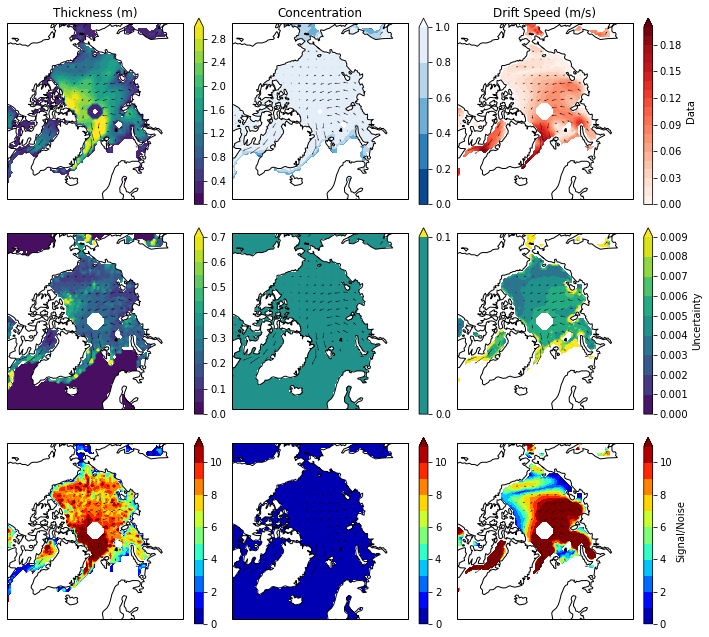

In [43]:
#### Signal to noise average for Inputs
## time to plot
t=slice(10,200)
# t=slice(100,101)
t_no=52
t_no = bud1.get_index(dt.datetime(2015,2,1))
t=slice(t_no,t_no+1)
# points = [[-30,75],[120,75],[0,90]] ## central barents
# points = [[0,75],[60,75],[0,86]] ### zoom barents edge #### force map to include these points
points = [[-175,72],[-140,68],[-160,86]] ## Beaufort ish
lims = G.lims_from_lonlat(points,for_extent = True)
lmax = 0.7
vmax = 0.4
nplots = 3
level_list = [
    np.arange(0.0,3.2,0.2),
    np.arange(0.0,1.2,0.2), ## Co##
    np.arange(0.0,0.21,0.01),
#     np.arange(0.0,lmax,1.0)
#     np.arange(-lmax,lmax+0.01,0.01),
#     np.arange(-lmax,lmax+0.01,0.01),
#     np.arange(-lmax,lmax+0.01,0.01),
#     np.arange(-lmax,lmax+0.01,0.01),
    ### variances
    np.arange(0.0,0.75,0.05),
    np.arange(0.0,0.2,0.1), ## Co##
    np.arange(0.0,0.01,0.001),
#  +[np.arange(0,vmax+0.01,0.01)]*4
]+[np.arange(0.0,12.0,1.0)
]*6
arr_list = [
    bud1.thickness[t][0],
    bud1.concentration[t][0],
    np.hypot(bud1.ice_drift_x[t][0],bud1.ice_drift_y[t][0]),
#     bud1.intensification[t][0],
#     bud1.advection[t][0],
#     bud1.divergence[t][0],
#     bud1.residual[t][0],
    ### variances
    np.sqrt(bud1.Vol_sig[t][0]),
    np.zeros_like(bud1.Vol_sig[t][0])*0.1,
    np.sqrt(np.hypot(bud1.U_sig[t][0],bud1.V_sig[t][0])),
#     np.sqrt(bud1.int_sig[t][0]),
#     np.sqrt(bud1.adv_sig[t][0]),
#     np.sqrt(bud1.div_sig[t][0]),
#     np.sqrt(bud1.res_sig[t][0]),
    ### S/N
    bud1.thickness[t][0]/np.sqrt(bud1.Vol_sig[t][0]),
    np.ones_like(bud1.Vol_sig[t][0]),
    np.hypot(bud1.ice_drift_x[t][0],bud1.ice_drift_y[t][0])/np.sqrt(np.hypot(bud1.U_sig[t][0],bud1.V_sig[t][0])),
#     np.abs(bud1.intensification[t][0])/ np.sqrt(bud1.int_sig[t])[0],
#     np.abs(bud1.advection[t][0])/ np.sqrt(bud1.adv_sig[t])[0],
#     np.abs(bud1.divergence[t][0])/ np.sqrt(bud1.div_sig[t])[0],
#     np.abs(bud1.residual[t][0])/ np.sqrt(bud1.res_sig[t])[0],
    
    
#     np.nansum(np.stack((bud1.intensification[t],bud1.int_t[t])),axis=(0,1)),
#     np.nansum(np.stack((bud1.residual[t],bud1.res_t[t])),axis=(0,1)),
#     np.nansum(np.stack((bud1.advection[t],bud1.adv_t[t])),axis=(0,1)),
#     np.nansum(np.stack((bud1.divergence[t],bud1.div_t[t])),axis=(0,1)),
]
cmap_list = [
    plt.cm.viridis,
    plt.cm.Blues_r,
    plt.cm.Reds,
#     plt.cm.RdBu,
#     plt.cm.RdBu,
#     plt.cm.RdBu,
#     plt.cm.RdBu,
# ]+[plt.cm.viridis]*6+[plt.cm.jet]*6
]+[plt.cm.viridis]*nplots+[plt.cm.jet]*nplots
lab_list = [
        'Thickness (m)',
        'Concentration',
        'Drift Speed (m/s)',
#            'Int.',
#            'Adv.',
#            'Div.',
#            'Res.',
        'Thickness (m)',
        'Concentration',
        'Drift Speed (m/s)',
#            'Int.',
#            'Res.',
#            'Adv.',
#            'Div.',
        'Thickness (m)',
        'Concentration',
        'Drift Speed (m/s)',
#            'Int.',
#            'Res.',
#            'Adv.',
#            'Div.',
           ]
# xv,yv = G2Gplot.rg_vecs(bud.ice_drift_x[t],bud.ice_drift_y[t])
xv,yv = G2Gplot.rg_vecs(
#     np.nanmean(bud.ice_drift_x[t],axis=0),
#     np.nanmean(bud.ice_drift_y[t],axis=0),
    bud1.ice_drift_x[t],
    bud1.ice_drift_y[t],
    )
#### plot concentration (vel grid)
# f = plt.figure(figsize=( 24,12))
f = plt.figure(figsize=( nplots*4,12))
for ns,(arr,levels,cmap,lab) in enumerate(zip(arr_list,level_list,cmap_list,lab_list)):
    ax = f.add_subplot(3,nplots,ns+1,projection=m)
#     ax.set_extent(lims,m)
    ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
    # s = ax.contourf(Gthk.xpts,Gthk.ypts,Tslices[0],levels = levels)
    arr = arr*G.mask
#     arr = np.nanmean(arr,axis = 0)
    s = ax.contourf(G.xpts,G.ypts,arr,levels = levels,
#     s = ax.pcolormesh(G.xptp,G.yptp,arr,levels = levels,
                    cmap = cmap,extend='max')
    ax.quiver(Gplot.xpts,Gplot.ypts,xv,yv,scale = 2.5)
    ax.add_feature(cfeature.COASTLINE)
    cb = plt.colorbar(s,shrink=0.80)
    if ns<nplots:
        ax.set_title(lab)
    if ns == nplots-1:
        cb.set_label('Data')
    if ns == nplots*2-1:
        cb.set_label('Uncertainty')
    if ns == nplots*3-1:
        cb.set_label('Signal/Noise')
    

plt.subplots_adjust(wspace=0.02,hspace=-0.1)
plt.show()
f.savefig(save_dir+'Inputs_single_t_'+str(t_no)+'.png',bbox_inches='tight')

In [483]:
bud1.dates[t_no:t_no+12]

[datetime.datetime(2015, 2, 7, 0, 0),
 datetime.datetime(2015, 2, 8, 0, 0),
 datetime.datetime(2015, 2, 9, 0, 0),
 datetime.datetime(2015, 2, 10, 0, 0),
 datetime.datetime(2015, 2, 11, 0, 0),
 datetime.datetime(2015, 2, 12, 0, 0),
 datetime.datetime(2015, 2, 13, 0, 0),
 datetime.datetime(2015, 2, 14, 0, 0),
 datetime.datetime(2015, 2, 15, 0, 0),
 datetime.datetime(2015, 2, 16, 0, 0),
 datetime.datetime(2015, 2, 17, 0, 0),
 datetime.datetime(2015, 2, 18, 0, 0)]

In [320]:
# bud.dates

In [19]:
t = slice(None)
t_use = slice(None)
lab_list = ['Int','Res','Adv','Div',]
arr_list = [
    np.abs(bud1.intensification[t])/ np.sqrt(bud1.int_sig[t]),
    np.abs(bud1.residual[t])/ np.sqrt(bud1.res_sig[t]),
    np.abs(bud1.advection[t])/ np.sqrt(bud1.adv_sig[t]),
    np.abs(bud1.divergence[t])/ np.sqrt(bud1.div_sig[t]),
]
rg_sn_dict = {}
for rg in regions:
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    for name,arr in zip(lab_list,arr_list):
        arr[np.isinf(arr)] = np.nan
        bud1.data = arr
        rg_sn_dict[name+rg['label']+'_mean'] = np.nanmean(bud1[t_use])
        for s in range(1,6):
            rg_sn_dict[name+rg['label']+str(s)] = np.sum(bud1[t_use]>s)/np.sum(bud1[t_use]>0) 
# rg_sn_dict

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array
Building new mask array


In [20]:
### makes a table, copy paste it into a tex file
from tabulate import tabulate

# rows = Int,Adv,Div,Res
lab_list = [ 'Int','Adv','Div','Res',]
#Cols, for each sn>s, mean sn
##    Daily 2015
##    Monthly
##    Growth
##    Melt
s = 2
rows = [[nm]+[rg['label'].replace('_',', ')]+["{:.2f}".format(d_pd[dvar+rg['label']+'_mean'])+' '+"{:.1f}".format(d_pd[dvar+rg['label']+str(s)]*100) 
         for dvar in lab_list] 
         for nm,d_pd in zip(['This data'],[rg_sn_dict])
         for rg in regions] 
   

print(tabulate(rows,
           headers=['']+['Region']+lab_list
               , tablefmt='fancy_grid'))

╒═══════════╤════════════════════════╤═══════════╤═══════════╤═══════════╤═══════════╕
│           │ Region                 │ Int       │ Adv       │ Div       │ Res       │
╞═══════════╪════════════════════════╪═══════════╪═══════════╪═══════════╪═══════════╡
│ This data │ Basin                  │ 2.87 53.7 │ 1.23 18.3 │ 1.82 30.1 │ 3.98 66.8 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Beaufort, Chukchi      │ 2.92 54.0 │ 1.30 20.7 │ 2.17 38.1 │ 3.89 65.3 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Siberian, Laptev, Kara │ 3.08 56.1 │ 1.23 19.3 │ 1.98 33.4 │ 4.70 73.2 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Central                │ 2.73 52.8 │ 1.18 16.2 │ 1.53 23.9 │ 3.63 64.0 │
├───────────┼────────────────────────┼───────────┼───────────┼───────────┼───────────┤
│ This data │ Barents                │ 2.17

In [51]:
import pickle
# create a binary pickle file 
# f = open("regions_daily_2015sn.pkl","wb")
# f = open("regions_monthly_sn.pkl","wb")
# pickle.dump(rg_sn_dict,f)
# f.close()

In [47]:
!ls *.pkl

dail_2015_sn.pkl            regions_daily2015_sn.pkl
monthly_sn.pkl              regions_daily_2015_sn.pkl
region_season_grow_sn.pkl   regions_monthly_sn.pkl
region_season_growth_sn.pkl season_grow_sn.pkl
region_season_melt_sn.pkl   season_melt_sn.pkl


In [486]:
# import pickle
# # create a binary pickle file 
# # f = open("regions_daily2015_sn.pkl","wb")
# pickle.dump(rg_sn_dict,f)
# f.close()

In [52]:
import pickle
## all the sn versions
# files = ['dail_2015_sn.pkl',   'monthly_sn.pkl',     'season_grow_sn.pkl', 'season_melt_sn.pkl']
files = ['regions_daily2015_sn.pkl',   'regions_monthly_sn.pkl',     'region_season_growth_sn.pkl', 'region_season_melt_sn.pkl']
names = ['Daily 2015','Monthly','Growth Season','Melt Season']
data_day  = pickle.load( open(files[0], "rb") )
data_month  = pickle.load( open(files[1], "rb") )
data_grow  = pickle.load( open(files[2], "rb") )
data_melt  = pickle.load( open(files[3], "rb") )

In [45]:
[d for dvar in lab_list for d in ["{:.2f}".format(data_day[dvar+rg['label']+'_mean']),"{:.1f}".format(data_day[dvar+rg['label']+str(s)]*100) ]
         ] 

['1.37', '9.2', '0.80', '1.3', '1.50', '10.2', '2.30', '24.7']

In [54]:
### makes a table, copy paste it into a tex file
from tabulate import tabulate

# rows = Int,Adv,Div,Res
lab_list = [ 'Int','Adv','Div','Res',]
col_lab_list = [ 'Int','\% > 3','Adv','\% > 3','Div','\% > 3','Res','\% > 3',]
#Cols, for each sn>s, mean sn
##    Daily 2015
##    Monthly
##    Growth
##    Melt
s = 3
rows = [[nm]+[rg['label'].replace('_',', ')]+[d for dvar in lab_list for d in ["{:.2f}".format(d_pd[dvar+rg['label']+'_mean']),"{:.1f}".format(d_pd[dvar+rg['label']+str(s)]*100)] ]
#          for nm,d_pd in zip(['This data'],[rg_sn_dict])
         for nm,d_pd in zip(names,[data_day,data_month,data_grow,data_melt])
         for rg in regions[:]] 
# rows = [[nm]+["{:.2f}".format(d_pd[dvar+'_mean'])+' '+"{:.1f}".format(d_pd[dvar+str(s)]*100) for dvar in lab_list] 
#         for nm,d_pd in zip(names,[data_day,data_month,data_grow,data_melt])]
    

print(tabulate(rows,
           headers=['']+['Region']+col_lab_list
#                , tablefmt='fancy_grid'))
               , tablefmt="latex"))

\begin{tabular}{llrrrrrrrr}
\hline
               & Region                 &   Int &   \textbackslash{}\% \ensuremath{>} 3 &   Adv &   \textbackslash{}\% \ensuremath{>} 3 &   Div &   \textbackslash{}\% \ensuremath{>} 3 &   Res &   \textbackslash{}\% \ensuremath{>} 3 \\
\hline
 Daily 2015    & Basin                  &  1.29 &      9.2 &  0.64 &      0.4 &  1.19 &      6.7 &  1.96 &     19.3 \\
 Daily 2015    & Beaufort, Chukchi      &  1.41 &     11   &  0.65 &      0.5 &  1.16 &      6.2 &  2.06 &     19.5 \\
 Daily 2015    & Siberian, Laptev, Kara &  1.31 &      9.8 &  0.65 &      0.5 &  1.22 &      7.3 &  2.11 &     21.3 \\
 Daily 2015    & Central                &  1.21 &      8.1 &  0.62 &      0.3 &  1.19 &      6.6 &  1.85 &     18.1 \\
 Daily 2015    & Barents                &  1.82 &     16.1 &  0.78 &      1.3 &  1.29 &      8.3 &  2.42 &     27.2 \\
 Daily 2015    & Greenland              &  1.94 &     19.5 &  0.82 &      0.9 &  1.39 &      9.3 &  2.45 &     28.1 \\
 Daily 20

In [27]:
bud1.yrpd

masked_array(
  data=[[--, --, --, ..., --, --, --],
        [2, --, --, ..., --, --, --],
        [14, --, --, ..., --, --, --],
        ...,
        [86, --, --, ..., --, --, --],
        [98, --, --, ..., --, --, --],
        [110, --, --, ..., --, --, --]],
  mask=[[ True,  True,  True, ...,  True,  True,  True],
        [False,  True,  True, ...,  True,  True,  True],
        [False,  True,  True, ...,  True,  True,  True],
        ...,
        [False,  True,  True, ...,  True,  True,  True],
        [False,  True,  True, ...,  True,  True,  True],
        [False,  True,  True, ...,  True,  True,  True]],
  fill_value=999999)

/Users/h/Github/geo_data_group/data_year.py:765: RuntimeWarning: Mean of empty slice
  temp = np.nanmean([self.data[j] for i in idx for j in i if j>=t0 and j<=tE],axis = 0)


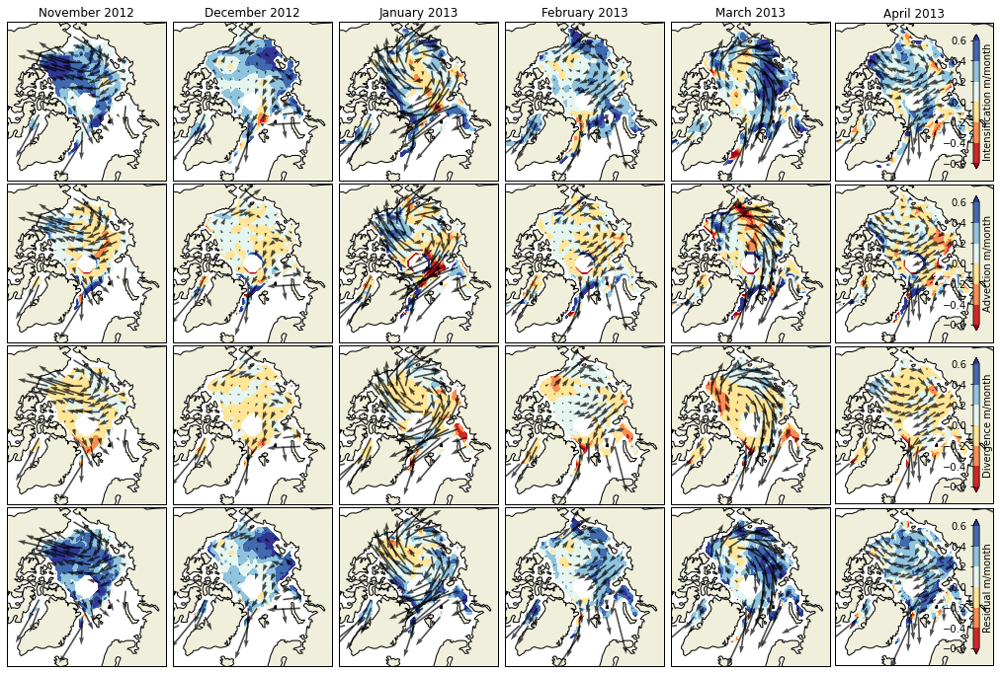

In [29]:

ba.plot_budget_season(bud1,10,6,[3,3],G,depth_nn=False,plot_label='av_growth_season_all',
                          drift_vectors=True,rv=(30,0.2,0.01,0.7),rvGplot = G2Gplot, dbug = False ,extend_div=False,save_dir=save_dir)

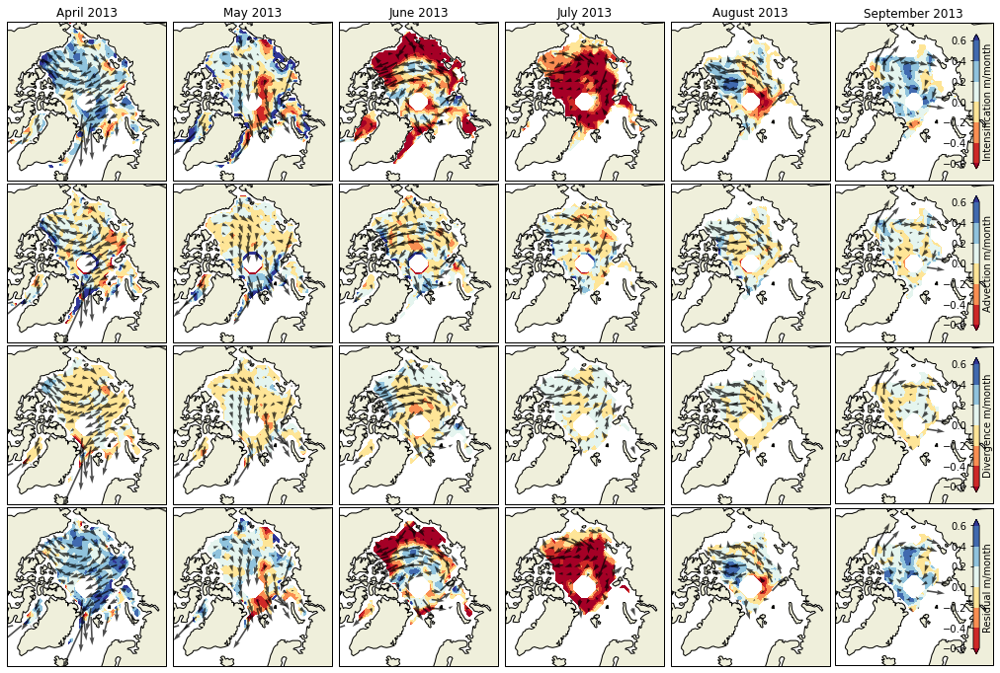

In [30]:

ba.plot_budget_season(bud1,3,6,[4,4],G,depth_nn=False,plot_label='av_melt_season_IT',
                          drift_vectors=True,rv=(30,0.2,0.01,0.7),rvGplot = G2Gplot, dbug = False ,extend_div=False,save_dir=save_dir)

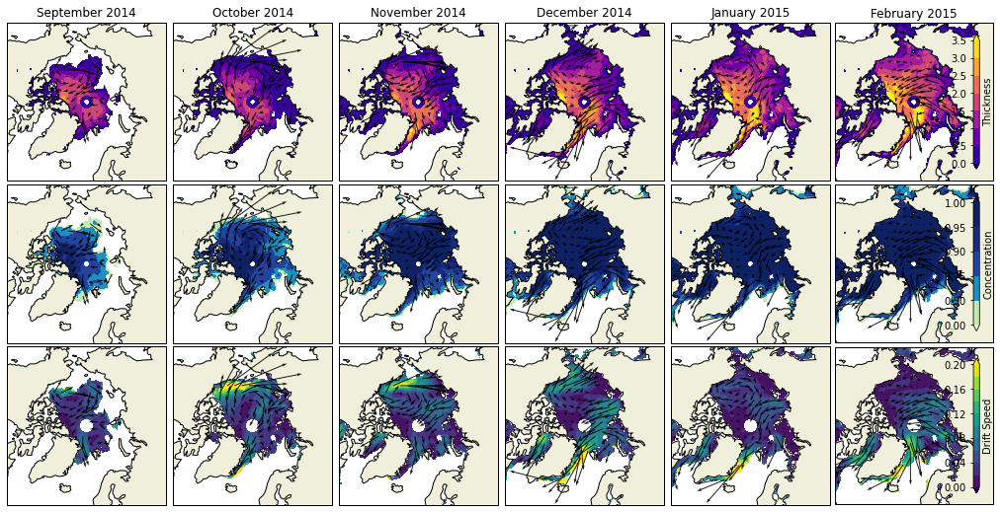

In [21]:
ba.plot_state_season(bud1,8,6,[1,1],G,dbug=False,rvGplot=G2Gplot,rv = [30,0.14,0.006,0.9])

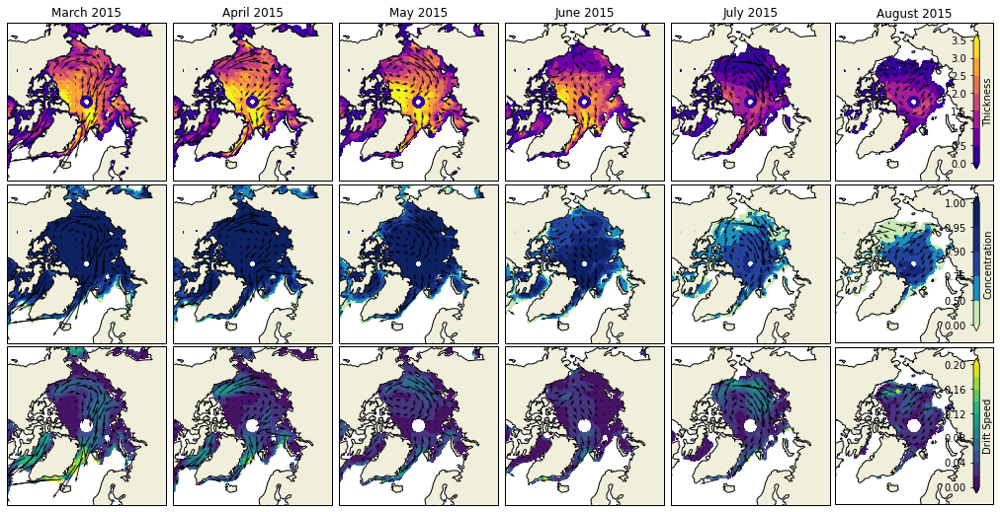

In [22]:
ba.plot_state_season(bud1,2,6,[2,2],G,dbug=False,rvGplot=G2Gplot,rv = [30,0.14,0.006,0.9])

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:19: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


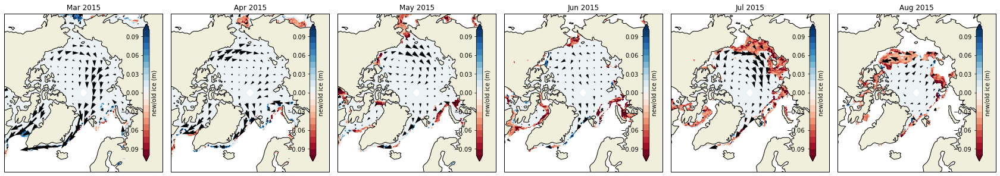

In [103]:
# t=slice(0,6)
# t=slice(6,12)
# tlist = [slice(0,6),slice(6,12)]
# labels = ['Growth','Melt']
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(6,12)]
labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),5))
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(1,len(tlist),pn+1,projection=m)
    ax = ba.plot_single(np.nanmean(bud1.old_ice[t]+bud1.new_ice[t],axis = 0),np.arange(-0.1,0.11,0.01),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='new/old ice (m)',cmap = plt.cm.RdBu)
    ax.set_title(lab)
fig.subplots_adjust(hspace=0.05,wspace=0.02)
fig.savefig(save_dir+'new_old_ice_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:13: RuntimeWarning: Mean of empty slice
  del sys.path[0]
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:14: RuntimeWarning: Mean of empty slice
  
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: Mean of empty slice
  from ipykernel import kernelapp as app
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


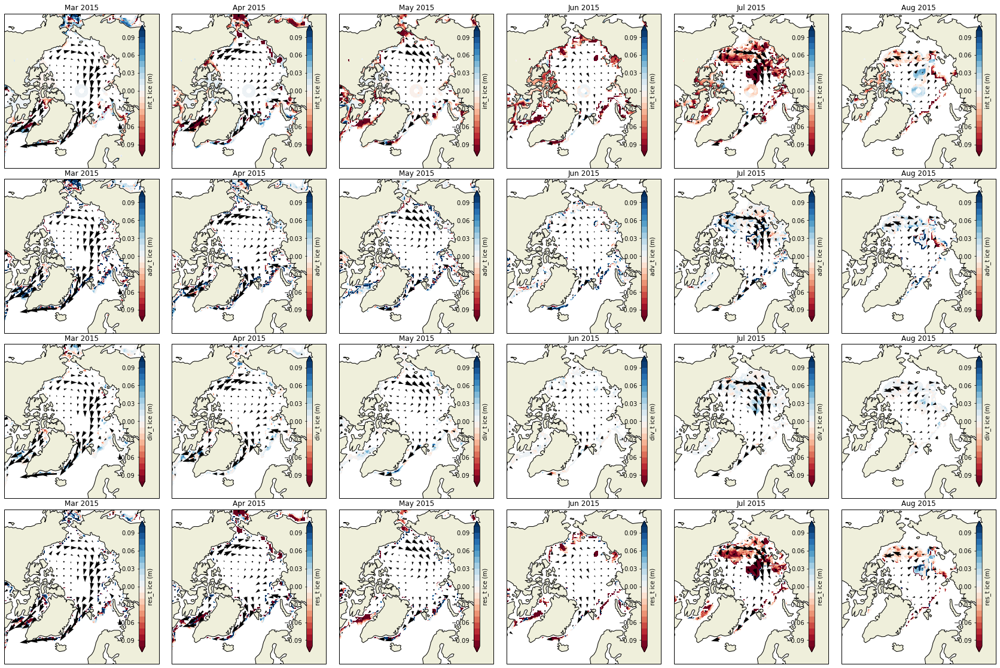

In [105]:
# t=slice(0,6)
# t=slice(6,12)
# tlist = [slice(0,6),slice(6,12)]
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(6,12)]
labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),20))
pvars = ['int_t','adv_t','div_t','res_t']
for cln,var,clab in zip([0,1,2,3],pvars,pvars):
    data = getattr(bud1,var).copy()
    for pn,(t,lab) in enumerate(zip(tlist,labels)):
        ax = fig.add_subplot(4,len(tlist),pn+cln*len(tlist)+1,projection=m)
        ax = ba.plot_single(np.nanmean(data[t],axis = 0),np.arange(-0.1,0.11,0.01),G,
                            vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                            vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                            rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                            label=clab+' ice (m)',cmap = plt.cm.RdBu)
        ax.set_title(lab)
fig.subplots_adjust(hspace=0.07,wspace=0.02)
fig.savefig(save_dir+'bud_missing_thick_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


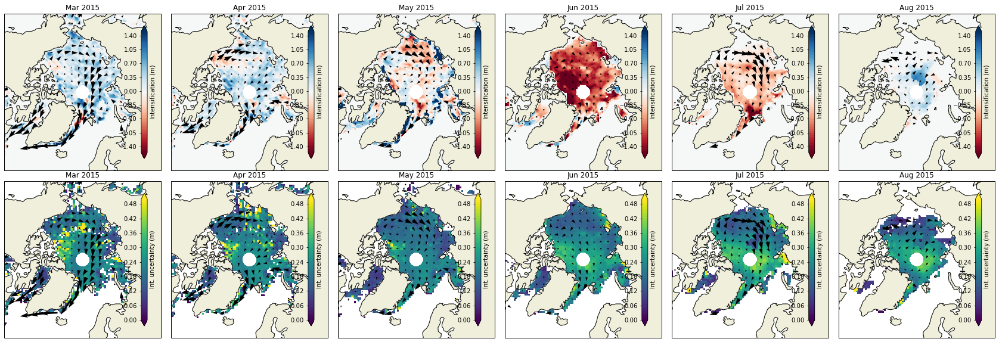

In [111]:
# t=slice(0,6)
# t=slice(6,12)
# tlist = [slice(0,6),slice(6,12)]
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(6,12)]
labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),10))
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),pn+1,projection=m)
    ax = ba.plot_single(np.nansum(bud1.intensification[t],axis = 0)*G.mask,np.arange(-1.55,1.55,0.05),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Intensification (m)',cmap = plt.cm.RdBu)
    ax.set_title(lab)
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),len(tlist)+pn+1,projection=m)
    pdata = np.sqrt(np.nansum(bud1.int_sig[t],axis = 0))*G.mask
    pdata[pdata<0.001] = np.nan
    ax = ba.plot_single(pdata,np.arange(0.0,0.51,0.01),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Int. uncertainty (m)',cmap = plt.cm.viridis)
    ax.set_title(lab)
fig.subplots_adjust(hspace=0.07,wspace=0.02)
fig.savefig(save_dir+'Int+uncert_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


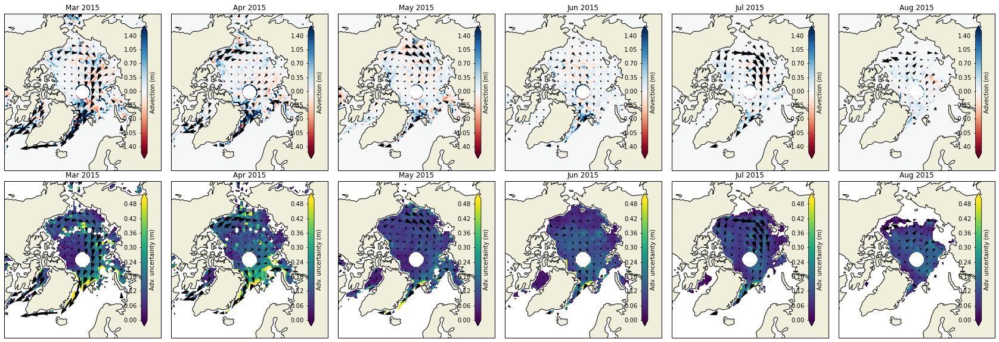

In [113]:
# t=slice(0,6)
# t=slice(6,12)
# tlist = [slice(0,6),slice(6,12)]
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(6,12)]
labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),10))
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),pn+1,projection=m)
    ax = ba.plot_single(np.nansum(bud1.advection[t],axis = 0)*G.mask,np.arange(-1.55,1.55,0.05),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Advection (m)',cmap = plt.cm.RdBu)
    ax.set_title(lab)
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),len(tlist)+pn+1,projection=m)
    pdata = np.sqrt(np.nansum(bud1.adv_sig[t],axis = 0))*G.mask
    pdata[pdata<0.001] = np.nan
    ax = ba.plot_single(pdata,np.arange(0.0,0.51,0.01),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Adv. uncertainty (m)',cmap = plt.cm.viridis)
    ax.set_title(lab)
fig.subplots_adjust(hspace=0.07,wspace=0.02)
fig.savefig(save_dir+'Adv+uncert_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


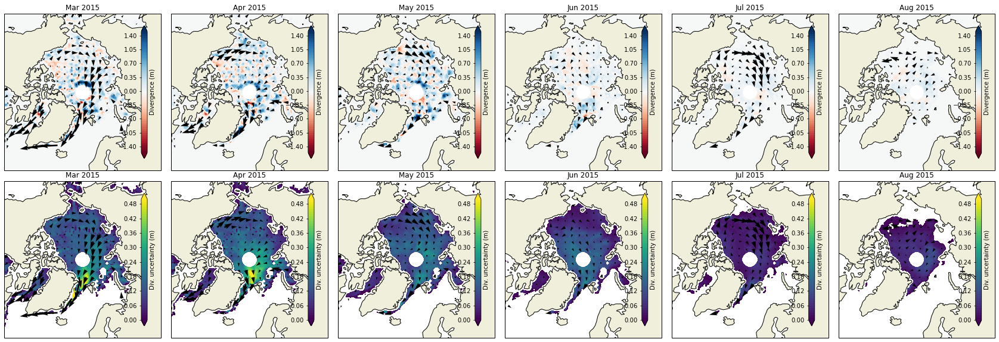

In [117]:
# t=slice(0,6)
# t=slice(6,12)
# tlist = [slice(0,6),slice(6,12)]
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(6,12)]
labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),10))
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),pn+1,projection=m)
    ax = ba.plot_single(np.nansum(bud1.divergence[t],axis = 0)*G.mask,np.arange(-1.55,1.55,0.05),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Divergence (m)',cmap = plt.cm.RdBu)
    ax.set_title(lab)
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),len(tlist)+pn+1,projection=m)
    pdata = np.sqrt(np.nansum(bud1.div_sig[t],axis = 0))*G.mask
    pdata[pdata<0.001] = np.nan
    ax = ba.plot_single(pdata,np.arange(0.0,0.51,0.01),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Div. uncertainty (m)',cmap = plt.cm.viridis)
    ax.set_title(lab)
fig.subplots_adjust(hspace=0.07,wspace=0.02)
fig.savefig(save_dir+'Div+uncert_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice
  # This is added back by InteractiveShellApp.init_path()
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:12: RuntimeWarning: Mean of empty slice
  if sys.path[0] == '':
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:21: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:22: RuntimeWarning: Mean of empty slice
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:28: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


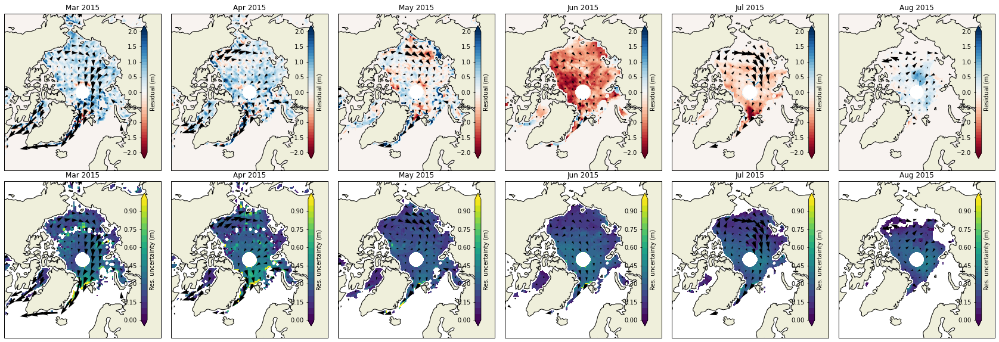

In [119]:
# t=slice(0,6)
# t=slice(6,12)
# tlist = [slice(0,6),slice(6,12)]
# tlist = [slice(t,t+1) for t in range(6)]
tlist = [slice(t,t+1) for t in range(6,12)]
labels = [bud1.dates[t][0].strftime('%b %Y') for t in tlist] 
fig = plt.figure(figsize=(5*len(tlist),10))
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),pn+1,projection=m)
    ax = ba.plot_single(np.nansum(bud1.residual[t],axis = 0)*G.mask,np.arange(-2.0,2.1,0.1),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Residual (m)',cmap = plt.cm.RdBu)
    ax.set_title(lab)
for pn,(t,lab) in enumerate(zip(tlist,labels)):
    ax = fig.add_subplot(2,len(tlist),len(tlist)+pn+1,projection=m)
    pdata = np.sqrt(np.nansum(bud1.res_sig[t],axis = 0))*G.mask
    pdata[pdata<0.001] = np.nan
    ax = ba.plot_single(pdata,np.arange(0.0,1.05,0.05),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Res. uncertainty (m)',cmap = plt.cm.viridis)
    ax.set_title(lab)
fig.subplots_adjust(hspace=0.07,wspace=0.02)
fig.savefig(save_dir+'Res+uncert_'+'_'.join([labels[0],labels[-1]]).replace(' ','-')+'.png',bbox_inches='tight')
fig.show()

In [ ]:
# t=slice(0,6)
# t=slice(6,12)
tlist = [slice(0,6),slice(6,12)]
fig = plt.figure(figsize=(10,10))
for pn,t,lab in zip([1,2],tlist,['Growth','Melt']):
    ax = fig.add_subplot(2,2,pn,projection=m)
    ax = ba.plot_single(np.nansum(bud1.residual[t],axis = 0)*G.mask,np.arange(-2.0,2.1,0.1),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Residual (m)',cmap = plt.cm.RdBu)
    ax.set_title(lab)
for pn,t,lab in zip([3,4],tlist,['Growth','Melt']):
    ax = fig.add_subplot(2,2,pn,projection=m)
    ax = ba.plot_single(np.sqrt(np.nansum(bud1.res_sig[t],axis = 0))*G.mask,np.arange(0.0,1.05,0.05),G,
                        vecx = np.nanmean(bud1.ice_drift_x[t],axis = 0),
                        vecy = np.nanmean(bud1.ice_drift_y[t],axis = 0),
                        rvGplot=G2Gplot,return_ax = True,give_ax=ax,
                        label='Res. uncertainty (m)',cmap = plt.cm.viridis)
    ax.set_title(lab)
plt.show()

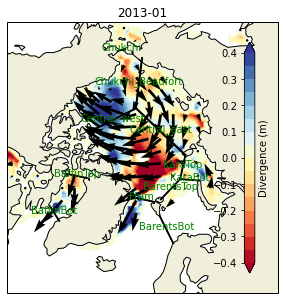

In [406]:
t = 16
bud1.set_var('divergence')
bud1.mask = False
# ax = ba.plot_single(bud1.mask[0],np.arange(-0.4,0.45,0.05),G,
# ax = ba.plot_single(bud1.clim_map([0,],mask=True),np.arange(-0.4,0.45,0.05),G,
ax = ba.plot_single(bud1.advection[t],np.arange(-0.4,0.45,0.05),G,
                    vecx = bud1.ice_drift_x[t],vecy=bud1.ice_drift_y[t],rvGplot=G2Gplot,
                    return_ax = True,label='Divergence (m)')
for gd in Gate_data:
    ax.plot(gd.G.xpts,gd.G.ypts,'k') 
    ax.text(gd.G.xpts.mean(),gd.G.ypts.mean(),gd.name,horizontalalignment='center',color='g')
plt.title(bud1.print_date(t))
plt.show()

In [460]:
[[ng,gd.name] for ng,gd in enumerate(Gate_data1)]

[[0, 'Fram'],
 [1, 'BarentsBot'],
 [2, 'BarentsTop'],
 [3, 'KaraTop'],
 [4, 'KaraBot'],
 [5, 'Chukchi'],
 [6, 'BaffinTop'],
 [7, 'BaffinBot'],
 [8, 'Central_east'],
 [9, 'Central_west'],
 [10, 'Chukchi_Beaufort']]

In [39]:
# ngates = len(Gate_data)
# fig = plt.figure(figsize=(10,20))
# for n,gd in enumerate(Gate_data):
#     ax = fig.add_subplot(ngates,1,n+1)
#     plt.plot(gd.clim_map(periods=[0,1,2,3],year_select=year_plus)[:,0]*gd.G.xdist[:,0]*1e-9)
#     plt.plot(gd.clim_map(periods=[0,1,2,3],year_select=year_mins)[:,0]*gd.G.xdist[:,0]*1e-9)
# #     plt.plot(gd.transport_x[t,:,0]*gd.G.xdist[:,0]*1e-9,'-r')
# #     plt.plot(gd.transport_y[t,:,0]*gd.G.xdist[:,0]*1e-9,'-g')
# #     plt.plot(gd.ice_drift_x[t,:,0],'-r')
# #     plt.plot(gd.ice_drift_y[t,:,0],'-g')
#     plt.xticks([])
#     plt.title(gd.print_date(t)+gd.name)
    

In [12]:
#### read NSIDC mask
mfile= '/Users/h/PREMELT/Budget/Michel_budget_plots/NSIDC_Regions_Masks.nc'
# mfile= '/Users/h/PREMELT/Budget/Michel_budget_plots/masks/mask_joint_int_clim_all.npy'
# mfile= '/Users/h/PREMELT/Budget/Michel_budget_plots/masks/mask_joint_int_months_100.npy'
Nmask = np.flipud(Dataset(mfile).variables['mask'][:].T)

rnames = [] 
for n,rn in enumerate(Dataset(mfile).variables['region_names'][:]):
    name = str(n+1)+': '
    for r in rn:
        name+=r.decode('UTF-8')
    rnames.append(name)
rnames

['1: Ice-free Oceans  ',
 '2: Sea of Okhotsk   ',
 '3: Bering           ',
 '4: Hudson Bay       ',
 '5: St John          ',
 '6: Baffin Bay       ',
 '7: East Greeland Sea',
 '8: Barents Sea      ',
 '9: Kara Sea         ',
 '10: Laptev Sea       ',
 '11: East Siberian Sea',
 '12: Chukchi Sea      ',
 '13: Beaufort Sea     ',
 '14: Canadian Islands ',
 '15: Central Arctic   ',
 '16: null             ',
 '17: null             ',
 '18: null             ',
 '19: null             ',
 '20: land             ',
 '21: land outline     ']

In [97]:
Ngrid  = gs.grid_set(m)
Ngrid.load_grid('grids/NSIDC_gs.npz')
NG2G = gs.Gs2Gs(Ngrid,G)
NG2G2 = gs.Gs2Gs(Ngrid,G2)

Loaded a grid: grids/NSIDC_gs.npz


In [91]:
### fix baffin bay
Nmask[np.logical_and(Nmask==6,Ngrid.lats<67)] = 0

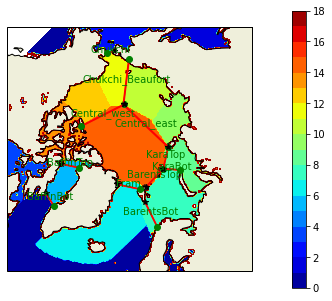

In [15]:
### all
fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(1,1,1,projection=m)
ax.set_extent([-180, 180, 60, 90], ccrs.PlateCarree())
s = ax.contourf(Ngrid.xpts, Ngrid.ypts,Nmask,
               levels = np.arange(0,19,1),cmap='jet')
# s = ax.pcolormesh(gm.G.xpts, gm.G.ypts,np.isin(Nmask,[2,3,4,5,6,7,8,9,10,11,12,13,14,15]))
# s = ax.pcolormesh(gm.G.xpts, gm.G.ypts,np.isin(Nmask,[8,9,10,11,12,13,14,15]))
# s = ax.pcolormesh(gm.G.xpts, gm.G.ypts,gm.mask[0])
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.COASTLINE)
# x,y = gm.G.mplot(lons_west,lats_west)
# ax.plot(x,y,'-m')
# x,y = gm.G.mplot(lons_east,lats_east)
# ax.plot(x,y,'-g')
for gd in Gate_data1:
#     if 'Fram' in gd.name:
    if '' in gd.name:
        ax.plot(gd.G.xpts,gd.G.ypts,'r') 
        ax.plot(gd.G.xpts[0,0],gd.G.ypts[0,0],'*k') 
        ax.plot(gd.G.xpts[-1,0],gd.G.ypts[-1,0],'og') 
        ax.text(gd.G.xpts.mean(),gd.G.ypts.mean(),gd.name,horizontalalignment='center',color='g')
cax = plt.colorbar(s,  pad=0.12,shrink= 0.85)

In [190]:
Gate_data = Gate_data2

In [189]:
regions = [
    {'N_ints':[8,9,10,11,12,13,15],'label':'Basin',
    'gates':[Gate_data1[i]for i in [0,5]],
    'gates_sign':[1.,1.],
    'div_lim':[-1.0,0.55],
    'seas_lim':10.5},
    {'N_ints':[12,13],'label':'Beaufort_Chukchi',
    'gates':[Gate_data1[i]for i in [9,10]],
    'gates_sign':[-1.,1.],
    'div_lim':[-0.4,0.35],
    'seas_lim':3.0},
    {'N_ints':[9,10,11],'label':'Siberian_Laptev_Kara',
    'gates':[Gate_data1[i]for i in [4,8,10]],
    'gates_sign':[-1,-1.,-1.],
    'div_lim':[-0.75,0.48],
    'seas_lim':3.5},
    {'N_ints':[15],'label':'Central',
    'gates':[Gate_data1[i]for i in [0,2,3,8,9]],
    'gates_sign':[1.,1.,1.,1.,1.],
    'div_lim':[-0.4,0.45],
    'seas_lim':5.5},
#     {'N_ints':[10,11],'label':'Siberian_Laptev'},
#     {'N_ints':[9],'label':'Kara'},
    {'N_ints':[8],'label':'Barents',
    'gates':[Gate_data1[i]for i in [1,2,4]],
    'gates_sign':[-1.,-1.,-1.],
    'div_lim':[-0.1,0.1],
    'seas_lim':0.35},
    {'N_ints':[7],'label':'Greenland',
    'gates':[Gate_data1[i]for i in [0]],
    'gates_sign':[-1.],
    'div_lim':[-0.37,0.37],
    'seas_lim':1.0},
    {'N_ints':[6],'label':'Baffin',
    'gates':[Gate_data1[i]for i in [7]],
    'gates_sign':[1.],
    'div_lim':[-0.15,0.1],
    'seas_lim':1.0},
#     {'N_ints':[6],'label':'Baffin'},
#     {'N_ints':[7],'label':'Greenland'},
]

In [191]:
regions2 = [
    {'N_ints':[8,9,10,11,12,13,15],'label':'Basin',
    'gates':[Gate_data2[i]for i in [0,5]],
    'gates_sign':[1.,1.],
    'div_lim':[-1.0,0.55],
    'seas_lim':10.5},
    {'N_ints':[12,13],'label':'Beaufort_Chukchi',
    'gates':[Gate_data2[i]for i in [9,10]],
    'gates_sign':[-1.,1.],
    'div_lim':[-0.4,0.35],
    'seas_lim':3.0},
    {'N_ints':[9,10,11],'label':'Siberian_Laptev_Kara',
    'gates':[Gate_data2[i]for i in [4,8,10]],
    'gates_sign':[-1,-1.,-1.],
    'div_lim':[-0.75,0.48],
    'seas_lim':3.5},
    {'N_ints':[15],'label':'Central',
    'gates':[Gate_data2[i]for i in [0,2,3,8,9]],
    'gates_sign':[1.,1.,1.,1.,1.],
    'div_lim':[-0.4,0.45],
    'seas_lim':5.5},
#     {'N_ints':[10,11],'label':'Siberian_Laptev'},
#     {'N_ints':[9],'label':'Kara'},
    {'N_ints':[8],'label':'Barents',
    'gates':[Gate_data2[i]for i in [1,2,4]],
    'gates_sign':[-1.,-1.,-1.],
    'div_lim':[-0.1,0.1],
    'seas_lim':0.35},
    {'N_ints':[7],'label':'Greenland',
    'gates':[Gate_data2[i]for i in [0]],
    'gates_sign':[-1.],
    'div_lim':[-0.37,0.37],
    'seas_lim':1.0},
    {'N_ints':[6],'label':'Baffin',
    'gates':[Gate_data2[i]for i in [7]],
    'gates_sign':[1.],
    'div_lim':[-0.15,0.1],
    'seas_lim':1.0},
#     {'N_ints':[6],'label':'Baffin'},
#     {'N_ints':[7],'label':'Greenland'},
]

In [192]:
bud = bud1

Building new mask array
Basin


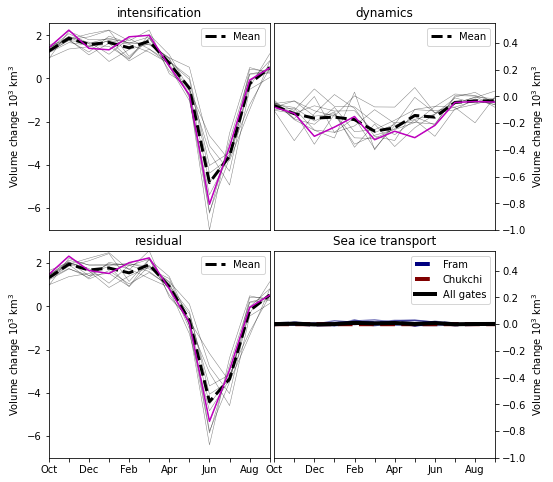

In [141]:
years=[8]
line_colors=['m']
t_set=[]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Seasonal_cycle_bud+gates_'
mlabel_step = 2
extend_div= False
mstart = 9
nmonths = 12
nrows = 2
ydim = 8
pscale = 1e-12
axlist = []
for rg in regions[:1]:
    minmax_d = [0.0,0.0]
    minmax_i = [0.0,0.0]
    axlist_d = []
    axlist_i = []
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    print(rg['label'])
#     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24
    mlist = [dt.datetime(2000,1,1) + relativedelta(months = mn) 
         for mn in range(mstart,mstart+nmonths)]
    mstr = [md.strftime('%b') for n,md in enumerate(mlist)]
    for i in range(nmonths):
        if np.mod(i,mlabel_step) != 0:
            mstr[i] = ''
    f= plt.figure(figsize=(8,ydim))
    for n, var in enumerate(['intensification','dynamics','residual']):
#     for n, var in enumerate(['divergence','advection','dynamics']):
        ax = f.add_subplot(nrows,2,n+1)
        if ('div' in var or 'vect' in var or 'dynamics' in var): 
            axlist_d.append(ax)
        else:
            axlist_i.append(ax)
        lines = []
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        plot_temp = bud.clim_mean(first_p=mstart,time_set=t_set,method='ysum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale,full_time = True)
        l, = ax.plot(plot_temp,'--k',linewidth = 3)#,
        if ('div' in var or 'vect' in var or 'dynamics' in var): 
            minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
            minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))
        else:
            minmax_i[0] = np.minimum(minmax_i[0],np.min(plot_temp))
            minmax_i[1] = np.maximum(minmax_i[1],np.max(plot_temp))
#                      label = 'Mean')

        lines.append(l)
        #### loop over all the years
        for y in range(bud.nyrs):
            if not bud.yrpd.mask[y,mstart]:
                t_p = bud.yrpd[y,mstart]
                plot_temp = np.nansum(bud[t_p:t_p+nmonths]*G.xdist[None,:,:]*G.ydist[None,:,:]*pscale,axis=(1,2))
#                 l, = 
                ax.plot(plot_temp,'k',alpha= 0.5,linewidth=0.5)
                if ('div' in var or 'vect' in var or 'dynamics' in var): 
                    minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
                    minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))
                else:
                    minmax_i[0] = np.minimum(minmax_i[0],np.min(plot_temp))
                    minmax_i[1] = np.maximum(minmax_i[1],np.max(plot_temp))
        for y_care,ls in zip(years,line_colors):
            if type(y_care)==list:
                ### accumlate averages for those in list
                plot_temp = []
                for y in y_care:
                    t_p = bud.yrpd[y,mstart]
                    plot_temp.append(np.nansum(bud[t_p:t_p+nmonths]*G.xdist[None,:,:]*G.ydist[None,:,:]*pscale,axis=(1,2)))
                plot_temp = np.nanmean(plot_temp,axis = 0)
            else:
                t_p = bud.yrpd[y_care,mstart]
                plot_temp = np.nansum(bud[t_p:t_p+nmonths]*G.xdist[None,:,:]*G.ydist[None,:,:]*pscale,axis=(1,2))
            l, = ax.plot(plot_temp,color=ls,)
#                         label = bud.print_date(bud.yrpd[y_care,mstart],string='%Y'))
            lines.append(l)
#         ax.legend(lines)
        if len(line_labels) == 0 and np.any([type(y)==list for y in years]):
            #### make auto labels if needed and groups of years
            line_labels = ['set "line_labels"']*np.shape(years)[0]
#         elif len(line_labels) == 0:
#             line_labels = [gl.print_date(gl.yrpd[y_care,mstart],string='%Y') 
#                            for y_care in years]
        ax.legend(lines,['Mean']+line_labels)
#         ax.legend(lines)
        ax.set_title(var)
        ax.axes.set_xlim([0,nmonths-1])
#         if n==0 or n==2:
        ax.set_ylabel('Volume change 10$^3$ km$^3$')
        if n==2 or n==3:
            ax.xaxis.set_ticks(range(0,nmonths))
            ax.xaxis.set_ticklabels(mstr)
        else:
            ax.xaxis.set_ticks([])
        if n==1 or n==3: 
            ax.yaxis.tick_right()
            ax.yaxis.set_label_position("right")
    #### all the gates too
#     ax = f.add_subplot(nrows,2,4)
#     for 
    
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    ax = f.add_subplot(2,2,4)
    axlist_d.append(ax)
    ax.set_title('Sea ice transport')
    rg['gates']
    gsum = []
    all_gates_all = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_x')
    # bud.data *= np.array(bud.days_per_slice)[:,None,None]
        plot_temp = gl.clim_mean(first_p=mstart,method='ysum',full_time=True,time_set=t_set,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        l, = ax.plot(np.array(plot_temp),linestyle = '--',color = cl,linewidth= 4,label=gl.name)
        lines.append(l)
        all_gates_all.append(plot_temp)

        #### loop over all the years
        for y in range(gl.nyrs):
            if not gl.yrpd.mask[y,mstart]:
                t_p = gl.yrpd[y,mstart]
                plot_temp = np.nansum(gl[t_p:t_p+nmonths]*gl.G.xdist[None,:,:]*gls*pscale/2,axis=(1,2))
                l, = ax.plot(plot_temp,color = cl,alpha= 0.5)
                minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
                minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))

    ax.xaxis.set_ticks(range(0,nmonths))
    ax.xaxis.set_ticklabels(mstr)
    ax.yaxis.tick_right()
    ax.yaxis.set_label_position("right")
    ax.set_ylabel('Volume change 10$^3$ km$^3$')
    l, = ax.plot(np.nansum(all_gates_all,axis = 0),'-k',linewidth= 4,label = 'All gates')

    #     ax.legend(lines,['Mean']+line_labels)
    ax.legend()
    #         ax.legend(lines)
    #     ax.set_title(gl.name)
    ax.axes.set_xlim([0,nmonths-1])
#     if type(save_dir) == str: 
    for ax in axlist_i: ax.set_ylim(minmax_i)
    minmax_d = rg['div_lim']
    for ax in axlist_d: ax.set_ylim(minmax_d)
    f.subplots_adjust(wspace=0.02, hspace=0.1)
#     f.savefig(save_dir+plot_label+'clim_lines'+rg['label']+plot_type,bbox_inches='tight')
    if show_plot: plt.show()

    

In [162]:
bud.name = 'Observations'
bud2.name = 'PIOMAS'

In [410]:
rg=regions[0]
rg['label']

'Basin'

In [82]:
bud = bud1

In [62]:
bud.dates[0]

datetime.datetime(2010, 10, 1, 0, 0)

Building new mask array
Barents


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:61: RuntimeWarning: divide by zero encountered in true_divide
/Users/h/Github/geo_data_group/data_year.py:443: RuntimeWarning: Mean of empty slice
  out_list = np.nanmean(temp,axis=(1,2))
/Users/h/Github/geo_data_group/data_year.py:443: RuntimeWarning: Mean of empty slice
  out_list = np.nanmean(temp,axis=(1,2))
/Users/h/Github/geo_data_group/data_year.py:443: RuntimeWarning: Mean of empty slice
  out_list = np.nanmean(temp,axis=(1,2))
/Users/h/Github/geo_data_group/data_year.py:443: RuntimeWarning: Mean of empty slice
  out_list = np.nanmean(temp,axis=(1,2))


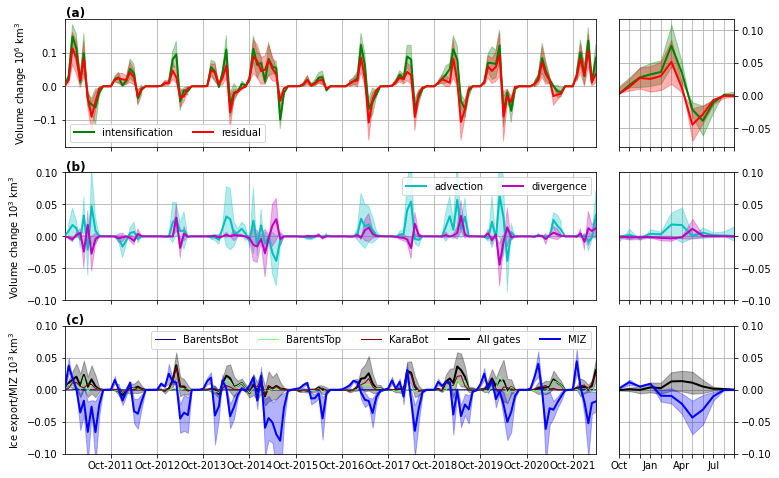

In [151]:
###### as above but the whole time series
years=[]
lines=[]
line_colors=[]
t_set=[]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Full_time_bud_exports_clip_'
mlabel_step = 3
extend_div= False
mstart = 9
nmonths = 12
nrows = 3
ydim = 8
pscale = 1e-12
ts = bud.dates[0]
te = bud.dates[-1]
octs_dt = [bud.dates[n*12] for n in range(1,bud.nyrs-1)]
mlist = [ts + relativedelta(months = mn) 
     for mn in range(12)]
mstr = [md.strftime('%b') for n,md in enumerate(mlist)]
axlist = []
axmlist = []
for rg in regions[4:5]:
    minmax_d = [0.0,0.0]
    axlist_d = []
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    print(rg['label'])
#     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24
    mlist = [dt.datetime(2000,1,1) + relativedelta(months = mn) 
         for mn in range(mstart,mstart+nmonths)]
    mstr = [md.strftime('%b') for n,md in enumerate(mlist)]
    for i in range(nmonths):
        if np.mod(i,mlabel_step) != 0:
            mstr[i] = ''
    f= plt.figure(figsize=(12,ydim))
    #### first plot, big variables
#     ax = f.add_subplot(nrows,1,1)
    ax = plt.subplot2grid((3,5),(0,0),colspan=4)
    ax.set_title('(a)',weight='bold',x=0.02,y=0.97)
    axm = plt.subplot2grid((3,5),(0,4),colspan=1)
    axlist.append(ax)
    axmlist.append(axm)
    for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                            ['int_sig','res_sig'],['g','r'])):
        bud.set_var(var)
#         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                          year_set = years,
                                        mult_array=G.xdist*G.ydist*pscale)
        ## S/N method
        b_signal = bud.data.copy()
        bud.set_var(var_s)
        bud.data = np.abs(b_signal)/np.sqrt(bud.data)
        bud.data[np.isinf(bud.data)] = np.nan
        dtemp,plot_temp_s = bud.mean_series(time_set=t_set,method='mean',mask=True,
                                          year_set = years)
#         bud.set_var(var_s)
#         bud.data = np.sqrt(bud.data)
# #         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
#         dtemp,plot_temp_s = bud.mean_series(time_set=t_set,method='sum',mask=True,
#                                           year_set = years,
#                                         mult_array=G.area*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
# plt.plot_date(dtemp,np.array(plot_temp2)*(1-1/np.array(plot_temp)),'-r')
#         plot_temp_s2 = [p+np.sqrt(ps) for p,ps in zip(plot_temp,plot_temp_s)]
        #### normal sig
#         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
#         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
        ## S/N
        plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
        plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
#         l, = ax.plot_date(dtemp,plot_temp_s2m,linestyle='--',color = cl,marker='',linewidth = 1)#,
        ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
        axm.plot(np.arange(12),np.nanmean([plot_temp[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                           color = cl,linewidth = 2)
        axm.fill_between(np.arange(12),np.nanmean([plot_temp_s2p[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                                       np.nanmean([plot_temp_s2m[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                              color = cl,alpha=0.3,zorder=1)
    ax.legend(ncol=2)
    ax.set_ylabel('Volume change 10$^6$ km$^3$')
    ax.xaxis.set_ticks(octs_dt)
    ax.xaxis.set_ticklabels([])
    ax.set_xlim([ts,te])
    ax.grid(True,zorder=-1.0)
    ax.set_axisbelow(True)
    axm.set_xlim([0,11])
    axm.xaxis.set_ticks(range(0,nmonths))
#     axm.xaxis.set_ticks([])
    axm.xaxis.set_ticklabels([])
    axm.yaxis.tick_right()
    axm.yaxis.set_label_position("right")
    axm.grid(True)
    axm.set_axisbelow(True)
    
    #### second is dynamics
#     ax = f.add_subplot(nrows,1,2)
    ax = plt.subplot2grid((3,5),(1,0),colspan=4)
    ax.set_title('(b)',weight='bold',x=0.02,y=0.97)
    axm = plt.subplot2grid((3,5),(1,4),colspan=1)
    axlist.append(ax)
    axmlist.append(axm)
    for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                             ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
        axlist_d.append(ax)
        axlist_d.append(axm)
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                          year_set = years,
                                        mult_array=G.xdist*G.ydist*pscale)
        ## S/N method
        b_signal = bud.data.copy()
        bud.set_var(var_s)
        bud.data = np.abs(b_signal)/np.sqrt(bud.data)
        bud.data[np.isinf(bud.data)] = np.nan
        dtemp,plot_temp_s = bud.mean_series(time_set=t_set,method='mean',mask=True,
                                          year_set = years)
#         bud.set_var(var_s)
#         bud.data = np.sqrt(bud.data)
#         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
#         dtemp,plot_temp_s = bud.mean_series(time_set=t_set,method='sum',mask=True,
#                                           year_set = years,
#                                         mult_array=G.area*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
#         plot_temp_s2 = [p+np.sqrt(ps) for p,ps in zip(plot_temp,plot_temp_s)]
#         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
#         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
        ## S/N
        plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
        plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
#         l, = ax.plot_date(dtemp,plot_temp_s2,linestyle='--',color = cl,marker='',linewidth = 1)#,
        minmax_d[1] = np.maximum(minmax_d[1],np.nanmax(plot_temp_s2p))
        minmax_d[0] = np.minimum(minmax_d[0],np.nanmin(plot_temp_s2p))
        ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
        axm.plot(np.arange(12),np.nanmean([plot_temp[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                           color = cl,linewidth = 2)
        axm.fill_between(np.arange(12),np.nanmean([plot_temp_s2p[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                                       np.nanmean([plot_temp_s2m[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                              color = cl,alpha=0.3,zorder=1)
    
    ax.legend(ncol=2)
    ax.set_ylabel('Volume change 10$^3$ km$^3$')
#     ax.xaxis.set_ticks([])
    ax.xaxis.set_ticks(octs_dt)
    ax.xaxis.set_ticklabels([])
    ax.set_xlim([ts,te])
    ax.grid(True,zorder=-1.0)
    ax.set_axisbelow(True)
    axm.set_xlim([0,11])
    axm.xaxis.set_ticks(range(0,nmonths))
#     axm.xaxis.set_ticks([])
    axm.xaxis.set_ticklabels([])
    axm.yaxis.tick_right()
    axm.yaxis.set_label_position("right")
    axm.grid(True,zorder=-1.0)
    axm.set_axisbelow(True)
    #### all the gates too
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
#     ax = f.add_subplot(3,1,3)
    ax = plt.subplot2grid((3,5),(2,0),colspan=4)
    ax.set_title('(c)',weight='bold',x=0.02,y=0.97)
    axm = plt.subplot2grid((3,5),(2,4),colspan=1)
    axlist.append(ax)
    axmlist.append(axm)
    axlist_d.append(ax)
    axlist_d.append(axm)
    rg['gates']
    gsum = []
    all_gates_all = []
    all_gates_s = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_y')
    # bud.data *= np.array(bud.days_per_slice)[:,None,None]
        dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                          year_set = years,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
                          marker='',linewidth= 1,label=gl.name,zorder=3)
        lines.append(l)
        all_gates_all.append(plot_temp)
        gl.set_var('trans_y_sig')
        gl.data = np.sqrt(gl.data)
        dtemp,plot_temps = gl.mean_series(method='sum',time_set=t_set,
                                          year_set = years,
                                    mult_array=gls*gl.G.xdist*pscale/2)
#         plt.errorbar([gcen[2*gn],gcen[2*gn+1]],plot_temp,fmt='.k',markersize=0,
#                      yerr=plot_temps,ecolor='k',capsize=4)
        all_gates_s.append(plot_temps)
    l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '-',color = 'k',
                      marker='',linewidth= 2,label = 'All gates')
#     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0)-np.nansum(all_gates_s,axis = 0),
#                       linestyle = '--',color = 'k',marker='',
#                       linewidth= 1)
#     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0)+np.nansum(all_gates_s,axis = 0),
#                       linestyle = '--',color = 'k',marker='',
#                       linewidth= 1)
    aga_sp = np.nansum(all_gates_all,axis = 0)+np.nansum(all_gates_s,axis = 0)
    aga_sm = np.nansum(all_gates_all,axis = 0)-np.nansum(all_gates_s,axis = 0)
    ax.fill_between(dtemp,aga_sp,aga_sm,
                            color = 'k',alpha=0.3,zorder=1)
    
    axm.plot(np.arange(12),np.nanmean([np.nansum(all_gates_all,axis=0)[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                       color = 'k',linewidth = 2)
    axm.fill_between(np.arange(12),np.nanmean([aga_sp[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                                   np.nanmean([aga_sm[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                          color = 'k',alpha=0.3,zorder=1)
    bud.set_var('MIZ')
    bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.xdist*G.ydist*pscale)
    bud.set_var('int_t')
    bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp_s = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.area*pscale)
    l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'b',marker='',linewidth = 2,label='MIZ',zorder=3)#,
    #     ax.legend(lines,['Mean']+line_labels)
    plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    minmax_d[1] = np.maximum(minmax_d[1],np.nanmax(plot_temp_s2p))
    minmax_d[0] = np.minimum(minmax_d[0],np.nanmin(plot_temp_s2p))
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'b',alpha=0.3,zorder=1)
    ax.set_ylabel('Ice export/MIZ 10$^3$ km$^3$')
    ax.legend(ncol=5)
    ax.grid(True,zorder=-1.0)
    axm.plot(np.arange(12),np.nanmean([plot_temp[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                       color = 'b',linewidth = 2)
    axm.fill_between(np.arange(12),np.nanmean([plot_temp_s2p[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                                   np.nanmean([plot_temp_s2m[n*12:(n+1)*12] for n in range(1,int(bud1.n_t/12))],axis=0),
                          color = 'b',alpha=0.3,zorder=1)
    ax.set_xlim([ts,te])
    ax.xaxis.set_ticks(octs_dt)
    ax.set_axisbelow(True)
    ax.xaxis.set_ticklabels([odt.strftime('%b-%Y') for odt in octs_dt])
    axm.set_xlim([0,11])
    axm.xaxis.set_ticks(range(0,nmonths))
    axm.xaxis.set_ticklabels(mstr)
    axm.yaxis.tick_right()
    axm.yaxis.set_label_position("right")
    axm.grid(True,zorder=-1.0)
    axm.set_axisbelow(True)
    #         ax.legend(lines)
    #     ax.set_title(gl.name)
#     ax.axes.set_xlim([0,nmonths-1])
    minmax_d = rg['div_lim']
    for ax in axlist_d: 
        ax.set_ylim(minmax_d)
#     f.savefig(save_dir+plot_label+'clim_lines_SN'+rg['label']+plot_type,bbox_inches='tight')
#     if show_plot: plt.show()

    

In [152]:
###### as above but adding another time series (BUD2)
plot_label = 'Full_time_bud_exports_DOUBLE'
ts = bud2.dates[0]
te = bud2.dates[-1]
# sometimes mean cycles don't line up
y_m_shift = -1

for rg in regions2[4:5]:
    bud2.mask=False
    rg_int= rg['N_ints']
    bud2.build_static_mask(
        np.isin(NG2G2.rg_array(Nmask,method='nearest'),rg_int))
    print(rg['label'])
    
    #### first plot, big variables
    ax = axlist[0]
    axm = axmlist[0]
    for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                            ['int_sig','res_sig'],['g','r'])):
        bud2.set_var(var)
#         bud2.data *= np.array(bud2.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='sum',mask=True,
                                          year_set = years,
                                        mult_array=G2.xdist*G2.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
        axm.plot(np.arange(12),np.nanmean([plot_temp[n*12+y_m_shift:(n+1)*12+y_m_shift] for n in range(1,int(bud2.n_t/12))],axis=0),
                           color = cl,linestyle='--',linewidth = 2)
    
    #### second is dynamics
    ax = axlist[1]
    axm = axmlist[1]
    for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                             ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
        bud2.set_var(var)
        bud2.data *= np.array(bud2.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='sum',mask=True,
                                          year_set = years,
                                        mult_array=G2.xdist*G2.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
#         ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
        axm.plot(np.arange(12),np.nanmean([plot_temp[n*12+y_m_shift:(n+1)*12+y_m_shift] for n in range(1,int(bud2.n_t/12))],axis=0),
                           color = cl,linestyle='--',linewidth = 2)
    
    #### all the gates too
    ax = axlist[2]
    axm = axmlist[2]
    rg['gates']
    gsum = []
    all_gates_all = []
    all_gates_s = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_y')
        dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                          year_set = years,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        all_gates_all.append(plot_temp)
    l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '--',color = 'k',
                      marker='',linewidth= 2,label = 'All gates')
    
    axm.plot(np.arange(12),np.nanmean([np.nansum(all_gates_all,axis=0)[n*12+y_m_shift:(n+1)*12+y_m_shift] for n in range(1,int(bud2.n_t/12))],axis=0),
                       color = 'k',linestyle = '--',linewidth = 2)
    bud2.set_var('MIZ')
#     bud2.data *= np.array(bud2.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G2.xdist*G2.ydist*pscale)
#                                     mult_array=G2.area*pscale)
    l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = 'b',marker='',linewidth = 2,label='MIZ',zorder=3)#,
#     ax.grid(True,zorder=-1.0)
    axm.plot(np.arange(12),np.nanmean([plot_temp[n*12+y_m_shift:(n+1)*12+y_m_shift] for n in range(1,int(bud2.n_t/12))],axis=0),
                       color = 'b',linestyle='--',linewidth = 2)
    f.savefig(save_dir+plot_label+'clim_lines_SN'+rg['label']+plot_type,bbox_inches='tight')
    if show_plot: plt.show()

    

Building new mask array
Barents


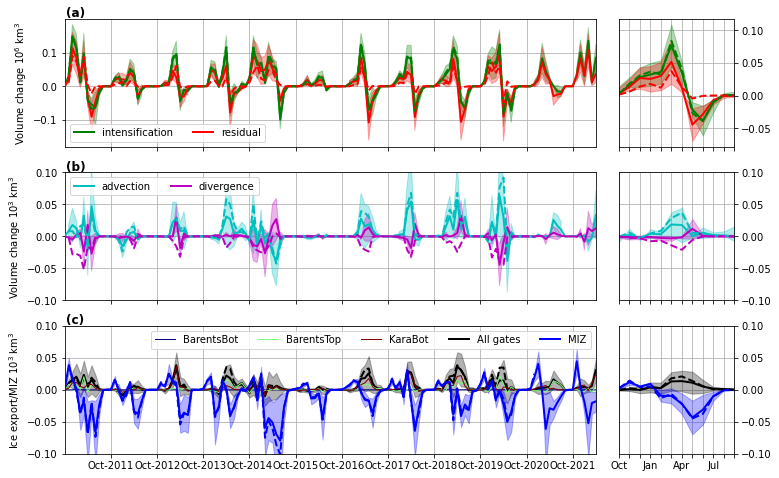

In [153]:
f

In [488]:
bud=bud1

In [173]:
NFram_rg = G.lims_from_lonlat([[21,79],[-18,80],[0,86]],for_extent=True)
NFram_rg

[-344680.35242596455,
 439572.97712794325,
 -1145126.7558509035,
 -446677.8661493482]

In [174]:
#### quick polygon to only include the plotted area
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon

lims = NFram_rg
x_vect = [lims[0],lims[0],lims[1],lims[1]]
y_vect = [lims[2],lims[3],lims[3],lims[2]]
poly_vect = np.column_stack((y_vect,x_vect)) # Reshape coordinates
polygon = Polygon(poly_vect) # create polygon

In [175]:
#### quick polygon to only include the plotted area
testm = np.ones(G.shape,dtype=bool)
for i in range(G.m):
    for j in range(G.n):
        point = Point(G.ypts[i,j],G.xpts[i,j])
        testm[i,j] = polygon.contains(point)

In [216]:
#### quick polygon to only include the plotted area
testm2 = np.ones(G2.shape,dtype=bool)
for i in range(G2.m):
    for j in range(G2.n):
        point = Point(G2.ypts[i,j],G2.xpts[i,j])
        testm2[i,j] = polygon.contains(point)

In [217]:
testm2[np.isnan(G2.mask)] = False

Got a grid res =  15  x  15
Grid distances calculated:  55908.79429885674  x  49983.52025942287
Angles calculated


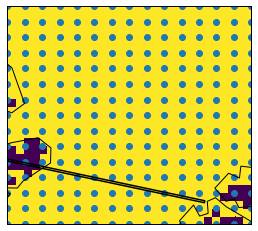

In [177]:
f = plt.figure()
ax = f.add_subplot(1,1,1,projection=m)
# ax.set_extent(G.x_extent, m)
ax.set_extent(NFram_rg, m)
Gplot.set_grid_mn(15,15,ax)
Gplot.gridinfo = False
Gplot.get_grid_info(av_ang=False)

G2Gplot= gs.Gs2Gs(G,Gplot,vectors=True)
# ax.plot(NFram_rg[0],NFram_rg[1],'*r')
ax.plot(Gates_list[0][0].x_border[:,0],Gates_list[0][0].x_border[:,1],'-k')
# ax.plot(Gates_list[0][0].xpts,Gates_list[0][0].ypts,'-k')
ax.add_feature(cfeature.COASTLINE)
ax.pcolormesh(G.xptp,G.yptp,testm)
ax.scatter(Gplot.xpts,Gplot.ypts)

G2Gplot= gs.Gs2Gs(G,Gplot,vectors=True)

In [218]:
np.sum(testm*G.area)*1e-9
np.sum(testm2*G2.area)*1e-9
# np.nansum(G.area)*1e-9

517.4792996332623

In [179]:
np.nanmean(bud1.Vol_sig*testm[None,:,:])
bud1.set_var('Vol_sig')
bud1.data = np.sqrt(bud1.data)
dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True)

Data year mask not set: ignoring it


In [193]:
###### Dailies full time
### CUSTOM region using Fram area map projection
### mask called testm
### data only
all_plot_data = []
years=[]
line_colors=[]
t_set=[]
line_labels = []
pscale = 1e-9
ts = bud1.dates[0]
te = bud1.dates[-1]
bud1.mask=False
bud1.build_static_mask(testm)
#     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24

bud1.set_var('thickness')
dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='mean',mask=True)
all_plot_data.append([plot_temp])
l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'k',marker='',linewidth = 3,label=var,zorder=3)#,
bud1.set_var('Vol_sig')
bud1.data = np.sqrt(bud1.data)
dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True)
plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
all_plot_data[-1].extend([plot_temp_s2p,plot_temp_s2m])

bud1.data = np.hypot(bud1.ice_drift_x,bud1.ice_drift_y)
dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='mean',mask=True)
all_plot_data.append([plot_temp])
bud1.data = np.hypot(bud1.U_sig,bud1.V_sig)
bud1.data = np.sqrt(bud1.data)
dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True)
plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
all_plot_data[-1].extend([plot_temp_s2p,plot_temp_s2m])

for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                        ['int_sig','res_sig'],['g','r'])):
    bud1.set_var(var)
#         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.xdist*G.ydist*pscale)
    all_plot_data.append([plot_temp])
    ## S/N method
    b_signal = bud1.data.copy()
    bud1.set_var(var_s)
    bud1.data = np.abs(b_signal)/np.sqrt(bud1.data)
    bud1.data[np.isinf(bud1.data)] = np.nan
    dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True,
                                      year_set = years)
    #### normal sig
#         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
#         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    # S/N
    plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    all_plot_data[-1].extend([plot_temp_s2p,plot_temp_s2m])
#         l, = ax.plot_date(dtemp,plot_temp_s2m,linestyle='--',color = cl,marker='',linewidth = 1)#,
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)

for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                         ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
    bud1.set_var(var)
#     bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.xdist*G.ydist*pscale)
    all_plot_data.append([plot_temp])
    ## S/N method
#     b_signal = bud1.data.copy()
#     bud1.set_var(var_s)
#     bud1.data = np.abs(b_signal)/np.sqrt(bud1.data)
#     bud1.data[np.isinf(bud1.data)] = np.nan
#     dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True,
#                                       year_set = years)
    bud1.set_var(var_s)
    bud1.data = np.sqrt(bud1.data)
#     bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.area*pscale)
    plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    all_plot_data[-1].extend([plot_temp_s2p,plot_temp_s2m])
#     ## S/N
#     plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
#     plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]

rg['gates']
gsum = []
all_gates_all = []
all_gates_s = []
# for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
gl = Gate_data1[0]
gls = 1.0
cl = 'k'
### for each sum all gates
gl.set_var('transport_y')
# bud1.data *= np.array(bud1.days_per_slice)[:,None,None]
dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                  year_set = years,
                           mult_array=gls*gl.G.xdist*pscale/2)
all_plot_data.append([plot_temp])

bud1.set_var('MIZ')
# bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
                                  year_set = years,
                                mult_array=G.xdist*G.ydist*pscale)
all_plot_data.append([plot_temp])
bud1.set_var('int_t')
# bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='sum',mask=True,
                                  year_set = years,
                                mult_array=G.area*pscale)
plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
all_plot_data[-1].extend([plot_temp_s2p,plot_temp_s2m])



Building new mask array


In [258]:
###### Dailies full time - second bud ovelay using bud2
### CUSTOM region using Fram area map projection
### mask called testm2
### data only
all_plot_data2 = []
years=[]
line_colors=[]
t_set=[]
line_labels = []
pscale = 1e-9
ts = bud2.dates[0]
te = bud2.dates[-1]
bud2.mask=False
bud2.build_static_mask(testm2)
#     ba.budget_clim_lines(bud2,9,12,G2)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24

bud2.set_var('thickness')
dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='mean',mask=True)
all_plot_data2.append([plot_temp])

bud2.data = np.hypot(bud2.ice_drift_x,bud2.ice_drift_y)
dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='mean',mask=True)
all_plot_data2.append([plot_temp])

for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                        ['int_sig','res_sig'],['g','r'])):
    bud2.set_var(var)
#         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G2.xdist*G2.ydist*pscale)
    all_plot_data2.append([plot_temp])

for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                         ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
    bud2.set_var(var)
#     bud2.data *= np.array(bud2.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G2.xdist*G2.ydist*pscale)
    all_plot_data2.append([plot_temp])

rg['gates']
gsum = []
gl = Gate_data2[0]
gls = 1.0
cl = 'k'
### for each sum all gates
gl.set_var('transport_y')
# bud2.data *= np.array(bud2.days_per_slice)[:,None,None]
dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                  year_set = years,
                           mult_array=gls*gl.G.xdist*pscale/2)
all_plot_data2.append([plot_temp])

bud2.set_var('MIZ')
# bud2.data *= np.array(bud2.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
dtemp,plot_temp = bud2.mean_series(time_set=t_set,method='sum',mask=True,
                                  year_set = years,
                                mult_array=G2.xdist*G2.ydist*pscale)
all_plot_data2.append([plot_temp])


Building new mask array


In [245]:
tm0 = bud1.get_index(dt.datetime(2014,9,1))
tm1 = bud1.get_index(dt.datetime(2015,10,1))

In [246]:
###### Dailies full time -- monthly overlay
### CUSTOM region using Fram area map projection
### mask called testm
### data only
all_plot_data_mnth = []
years=[]
line_colors=[]
t_set=[tm0,tm1]
line_labels = []
pscale = 1e-9
ts = dt.datetime(2014,10,1)
te = dt.datetime(2015,10,1)
budM1.mask=False
budM1.build_static_mask(testm)
#     ba.budget_clim_lines(budM1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24

budM1.set_var('thickness')
dtemp,plot_temp = budM1.mean_series(time_set=t_set,method='mean',mask=True)
all_plot_data_mnth.append([plot_temp])
l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'k',marker='',linewidth = 3,label=var,zorder=3)#,
budM1.set_var('Vol_sig')
budM1.data = np.sqrt(budM1.data)
dtemp,plot_temp_s = budM1.mean_series(time_set=t_set,method='mean',mask=True)
plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
all_plot_data_mnth[-1].extend([plot_temp_s2p,plot_temp_s2m])

budM1.data = np.hypot(budM1.ice_drift_x,budM1.ice_drift_y)
dtemp,plot_temp = budM1.mean_series(time_set=t_set,method='mean',mask=True)
all_plot_data_mnth.append([plot_temp])
budM1.data = np.hypot(budM1.U_sig,budM1.V_sig)
budM1.data = np.sqrt(budM1.data)
dtemp,plot_temp_s = budM1.mean_series(time_set=t_set,method='mean',mask=True)
plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
all_plot_data_mnth[-1].extend([plot_temp_s2p,plot_temp_s2m])

for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                        ['int_sig','res_sig'],['g','r'])):
    budM1.set_var(var)
#         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = budM1.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.xdist*G.ydist*pscale)#/30)
    all_plot_data_mnth.append([plot_temp])
    ## S/N method
    b_signal = budM1.data.copy()
    budM1.set_var(var_s)
    budM1.data = np.abs(b_signal)/np.sqrt(budM1.data)
    budM1.data[np.isinf(budM1.data)] = np.nan
    dtemp,plot_temp_s = budM1.mean_series(time_set=t_set,method='mean',mask=True,
                                      year_set = years)
    #### normal sig
#         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
#         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    # S/N
    plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    all_plot_data_mnth[-1].extend([plot_temp_s2p,plot_temp_s2m])
#         l, = ax.plot_date(dtemp,plot_temp_s2m,linestyle='--',color = cl,marker='',linewidth = 1)#,
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)

for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                         ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
    budM1.set_var(var)
#     budM1.data *= np.array(budM1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    dtemp,plot_temp = budM1.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.xdist*G.ydist*pscale)#/30)
    all_plot_data_mnth.append([plot_temp])
    ## S/N method
#     b_signal = budM1.data.copy()
#     budM1.set_var(var_s)
#     budM1.data = np.abs(b_signal)/np.sqrt(budM1.data)
#     budM1.data[np.isinf(budM1.data)] = np.nan
#     dtemp,plot_temp_s = budM1.mean_series(time_set=t_set,method='mean',mask=True,
#                                       year_set = years)
#     plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
#     plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]

    budM1.set_var(var_s)
    budM1.data = np.sqrt(budM1.data)
    dtemp,plot_temp_s = budM1.mean_series(time_set=t_set,method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.area*pscale)#/30)
    plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]

    all_plot_data_mnth[-1].extend([plot_temp_s2p,plot_temp_s2m])
rg['gates']
gsum = []
all_gates_all = []
all_gates_s = []
# for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
gl = Gate_data1[0]
gls = 1.0
cl = 'k'
### for each sum all gates
gl.set_var('transport_y')
# budM1.data *= np.array(budM1.days_per_slice)[:,None,None]
dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                  year_set = years,
                           mult_array=gls*gl.G.xdist*pscale/2)#/30)
all_plot_data_mnth.append([plot_temp])

budM1.set_var('MIZ')
# budM1.data *= np.array(budM1.days_per_slice)[:,None,None])#/30 ## convert to monthly growth 
dtemp,plot_temp = budM1.mean_series(time_set=t_set,method='sum',mask=True,
                                  year_set = years,
                                mult_array=G.xdist*G.ydist*pscale)
all_plot_data_mnth.append([plot_temp])
budM1.set_var('int_t')
# budM1.data *= np.array(budM1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
dtemp,plot_temp_s = budM1.mean_series(time_set=t_set,method='sum',mask=True,
                                  year_set = years,
                                mult_array=G.area*pscale)
plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
all_plot_data_mnth[-1].extend([plot_temp_s2p,plot_temp_s2m])



Building new mask array


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:52: RuntimeWarning: divide by zero encountered in true_divide


In [247]:
dtemp_mnth = [d + relativedelta(days=15) for d in dtemp]

In [197]:
np.mean(all_plot_data[0][0])
np.mean(all_plot_data_mnth[1][0])

0.08610513220203712

In [224]:
# plot_temp_mnth

In [226]:
# plot_temp_s2mnth

In [1365]:
help(ax.title)

Help on Text in module matplotlib.text object:

class Text(matplotlib.artist.Artist)
 |  Handle storing and drawing of text in window or data coordinates.
 |  
 |  Method resolution order:
 |      Text
 |      matplotlib.artist.Artist
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __getstate__(self)
 |  
 |  __init__(self, x=0, y=0, text='', color=None, verticalalignment='baseline', horizontalalignment='left', multialignment=None, fontproperties=None, rotation=None, linespacing=None, rotation_mode=None, usetex=None, wrap=False, **kwargs)
 |      Create a `.Text` instance at *x*, *y* with string *text*.
 |      
 |      Valid keyword arguments are:
 |      
 |      Properties:
 |          agg_filter: a filter function, which takes a (m, n, 3) float array and a dpi value, and returns a (m, n, 3) array
 |          alpha: float or None
 |          animated: bool
 |          backgroundcolor: color
 |          bbox: dict with properties for `.patches.FancyBboxPatch`
 |      

In [229]:
bud1.dates[0]

datetime.datetime(2014, 8, 31, 0, 0)

In [248]:
len(all_plot_data[0][0])
dtemp = [bud1.dates[0] + relativedelta(days=d) for d in range(bud1.n_t)]

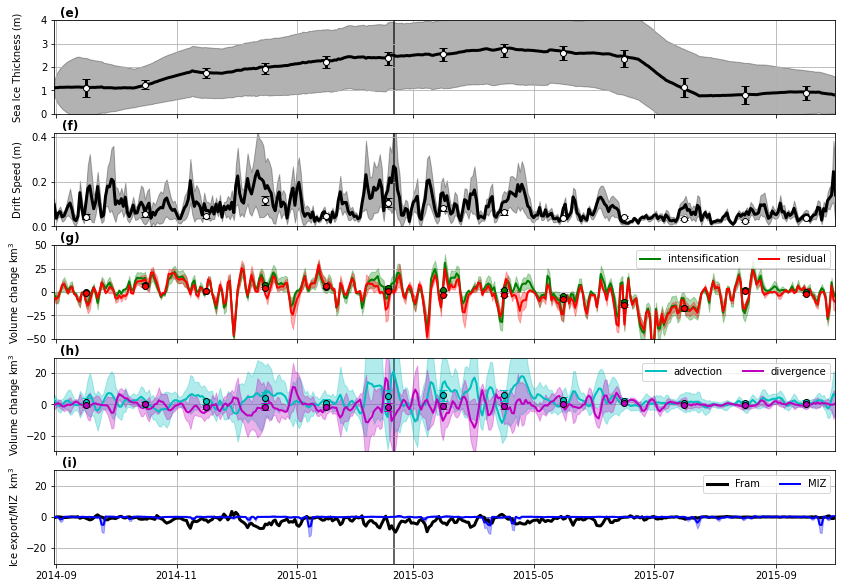

In [272]:
###### Dailies full time
### CUSTOM region using Fram area map projection
### mask called testm
### plotting only
dtemp = [bud1.dates[0] + relativedelta(days=d) for d in range(bud1.n_t)]
ax_list = []
years=[]
line_colors=[]
t_set=[]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Full_time_bud_daily_'
mlabel_step = 3
extend_div= False
mstart = 9
nmonths = 12
nrows = 3
ydim = 10
pscale = 1e-9
line_t = 172
# ts = bud1.dates[0]
# te = bud1.dates[-1]
ts = dtemp[0]
te = dtemp[-1]
minmax_d = [-30,30]
axlist_d = []
msc = 30

f= plt.figure(figsize=(14,ydim))
#### first plot, big variables
#     ax = f.add_subplot(nrows,1,1)
ax = plt.subplot2grid((5,5),(0,0),colspan=5) ## THickness
ax_list.append(ax)
ax.set_title('(e)',weight='bold',x=0.02,y=0.97)
# bud1.set_var('thickness')
# dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='mean',mask=True)
plot_temp = all_plot_data[0][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'k',marker='',linewidth = 3,label=var,zorder=3)#,

plot_temp_s2p = all_plot_data[0][1]
plot_temp_s2m = all_plot_data[0][2]
ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)
plot_temp_mnth = all_plot_data_mnth[0][0]
plot_temp_s2mnth = all_plot_data_mnth[0][1]
plot_temp_s2mnth = [p-s for p,s in zip(plot_temp_s2mnth,plot_temp_mnth)]
ax.errorbar(dtemp_mnth,plot_temp_mnth,yerr = plot_temp_s2mnth,
            fmt='ok',ecolor='k',ms =6,mfc='w',mec='k', elinewidth=3,capsize = 4,zorder=5)
ax.set_ylabel('Sea Ice Thickness (m)')
ax.yaxis.set_label_coords(-.04, .5)
ax.set_xlim([ts,te])
ax.set_ylim([0,4])
ax.xaxis.set_ticklabels([])
ax.grid(True,zorder=-1.0)
# ax.axvline(bud1.dates[line_t],color='k',alpha=0.8,zorder=-1)
ax.axvline(dt.datetime(2015,2,19),color='k',alpha=0.8,zorder=-1)

ax = plt.subplot2grid((5,5),(1,0),colspan=5) ## THickness
ax_list.append(ax)
ax.set_title('(f)',weight='bold',x=0.02,y=0.97)
plot_temp = all_plot_data[1][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'k',marker='',linewidth = 3,label=var,zorder=3)#,

plot_temp_s2p = all_plot_data[1][1]
plot_temp_s2m = all_plot_data[1][2]
ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)
plot_temp_mnth = all_plot_data_mnth[1][0]
plot_temp_s2mnth = all_plot_data_mnth[1][1]
plot_temp_s2mnth = [p-s for p,s in zip(plot_temp_s2mnth,plot_temp_mnth)]
ax.errorbar(dtemp_mnth,plot_temp_mnth,yerr = plot_temp_s2mnth,
            fmt='ok',ecolor='k',ms =6,mfc='w',mec='k', elinewidth=3,capsize = 4,zorder=5)
ax.set_ylabel('Drift Speed (m)')
ax.yaxis.set_label_coords(-.04, .5)
ax.set_xlim([ts,te])
ax.xaxis.set_ticklabels([])
ax.set_ylim([0,0.42])
ax.grid(True,zorder=-1.0)
# ax.axvline(bud1.dates[line_t],color='k',alpha=0.8,zorder=-1)
ax.axvline(dt.datetime(2015,2,19),color='k',alpha=0.8,zorder=-1)

ax = plt.subplot2grid((5,5),(2,0),colspan=5)
ax_list.append(ax)
ax.set_title('(g)',weight='bold',x=0.02,y=0.97)
for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                        ['int_sig','res_sig'],['g','r'])):
    plot_temp = all_plot_data[2+n][0]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
    plot_temp_s2p = all_plot_data[2+n][1]
    plot_temp_s2m = all_plot_data[2+n][2]
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
    plot_temp_mnth = all_plot_data_mnth[2+n][0]
    plot_temp_s2mnth = all_plot_data_mnth[2+n][1]
    plot_temp_s2mnth = [p-s for p,s in zip(plot_temp_s2mnth,plot_temp_mnth)]
    plot_temp_mnth = [p/msc for p in plot_temp_mnth]
    plot_temp_s2mnth = [p/msc for p in plot_temp_s2mnth]
    ax.errorbar(dtemp_mnth,plot_temp_mnth,yerr = plot_temp_s2mnth,
                fmt='ok',ecolor=cl,mfc=cl,ms =6, elinewidth=3,capsize = 4,zorder=5)
ax.legend(ncol=2)
ax.set_ylabel('Volume change km$^3$')
ax.yaxis.set_label_coords(-.04, .5)
# ax.xaxis.set_ticks(octs_dt)
ax.xaxis.set_ticklabels([])
ax.set_xlim([ts,te])
ax.set_ylim([-50,50])
ax.grid(True,zorder=-1.0)
# ax.axvline(bud1.dates[line_t],color='k',alpha=0.8,zorder=-1)
ax.axvline(dt.datetime(2015,2,19),color='k',alpha=0.8,zorder=-1)
ax.set_axisbelow(True)

#### second is dynamics
#     ax = f.add_subplot(nrows,1,2)
ax = plt.subplot2grid((5,5),(3,0),colspan=5)
ax_list.append(ax)
ax.set_title('(h)',weight='bold',x=0.02,y=0.97)
for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                         ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
    axlist_d.append(ax)
    plot_temp = all_plot_data[4+n][0]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
    plot_temp_s2p = all_plot_data[4+n][1]
    plot_temp_s2m = all_plot_data[4+n][2]
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
    plot_temp_mnth = all_plot_data_mnth[4+n][0]
    plot_temp_s2mnth = all_plot_data_mnth[4+n][1]
    plot_temp_s2mnth = [p-s for p,s in zip(plot_temp_s2mnth,plot_temp_mnth)]
    plot_temp_mnth = [p/msc for p in plot_temp_mnth]
    plot_temp_s2mnth = [p/msc for p in plot_temp_s2mnth]
    ax.errorbar(dtemp_mnth,plot_temp_mnth,yerr = plot_temp_s2mnth,
                fmt='ok',ecolor=cl,mfc=cl,ms =6, elinewidth=3,capsize = 4,zorder=5)

ax.legend(ncol=2)
ax.set_ylabel('Volume change km$^3$')
ax.yaxis.set_label_coords(-.04, .5)
# ax.xaxis.set_ticks(octs_dt)
ax.xaxis.set_ticklabels([])
ax.set_xlim([ts,te])
ax.grid(True,zorder=-1.0)
# ax.axvline(bud1.dates[line_t],color='k',alpha=0.8,zorder=-1)
ax.axvline(dt.datetime(2015,2,19),color='k',alpha=0.8,zorder=-1)
ax.set_axisbelow(True)
# #### all the gates too
# clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
# #     ax = f.add_subplot(3,1,3)
ax = plt.subplot2grid((5,5),(4,0),colspan=5)
ax_list.append(ax)
ax.set_title('(i)',weight='bold',x=0.02,y=0.97)
axlist_d.append(ax)
rg['gates']
gsum = []
all_gates_all = []
all_gates_s = []
# for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
gl = Gate_data1[0]
gls = 1.0
cl = 'k'
### for each sum all gates
gl.set_var('transport_y')
plot_temp = all_plot_data[6][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
                  marker='',linewidth= 3,label=gl.name,zorder=3)
lines.append(l)
plot_temp = all_plot_data[7][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'b',marker='',linewidth = 2,label='MIZ',zorder=3)#,
plot_temp_s2p = all_plot_data[7][1]
plot_temp_s2m = all_plot_data[7][2]
ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'b',alpha=0.3,zorder=1)
ax.set_ylabel('Ice export/MIZ  km$^3$')
ax.yaxis.set_label_coords(-.04, .5)
ax.legend(ncol=3)
ax.grid(True,zorder=-1.0)
# ax.axvline(bud1.dates[line_t],color='k',alpha=0.8,zorder=-1)
ax.axvline(dt.datetime(2015,2,19),color='k',alpha=0.8,zorder=-1)
ax.set_xlim([ts,te])
# ax.xaxis.set_ticks(octs_dt)
ax.set_axisbelow(True)
# ax.xaxis.set_ticklabels([odt.strftime('%b-%Y') for odt in octs_dt])
#         ax.legend(lines)
#     ax.set_title(gl.name)
#     ax.axes.set_xlim([0,nmonths-1])
for ax in axlist_d: 
    ax.set_ylim(minmax_d)
# f.savefig(save_dir+'lines_daily_all_FRAM.pdf',bbox_inches='tight')
# if show_plot: plt.show()



In [250]:
len(all_plot_data[0][0])
dtemp = [bud2.dates[0] + relativedelta(days=d) for d in range(bud2.n_t)]

In [276]:
###### Dailies full time
### CUSTOM region using Fram area map projection
### mask called testm
### plotting only
dtemp = [bud2.dates[0] + relativedelta(days=d) for d in range(bud2.n_t)]

plot_type='.pdf'
plot_label = 'Full_time_bud_daily_EXTRA'
ts = dtemp[0]
te = dtemp[-1]
minmax_d = [-30,30]
axlist_d = []
msc = 30

# bud1.set_var('thickness')
# dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='mean',mask=True)
# ax = ax_list[0]
# plot_temp = all_plot_data2[0][0]
# l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = 'k',marker='',linewidth = 3,label=var,zorder=3)#,

ax = ax_list[1]
plot_temp = all_plot_data2[1][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = 'k',marker='',linewidth = 3,label=var,zorder=3)#,
ax = ax_list[2]
for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                        ['int_sig','res_sig'],['g','r'])):
    if 'int' in var: continue
    plot_temp = all_plot_data2[2+n][0]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,

ax = ax_list[3]
for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                         ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
    plot_temp = all_plot_data2[4+n][0]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,

ax = ax_list[4]
plot_temp = all_plot_data2[6][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle = '--',color = 'k',
                  marker='',linewidth= 3,label=gl.name,zorder=3)

plot_temp = all_plot_data2[7][0]
l, = ax.plot_date(dtemp,plot_temp,linestyle='--',color = 'b',marker='',linewidth = 2,label='MIZ',zorder=3)#,
f.savefig(save_dir+'lines_daily_all_FRAM_EXTRA.pdf',bbox_inches='tight')
# if show_plot: plt.show()



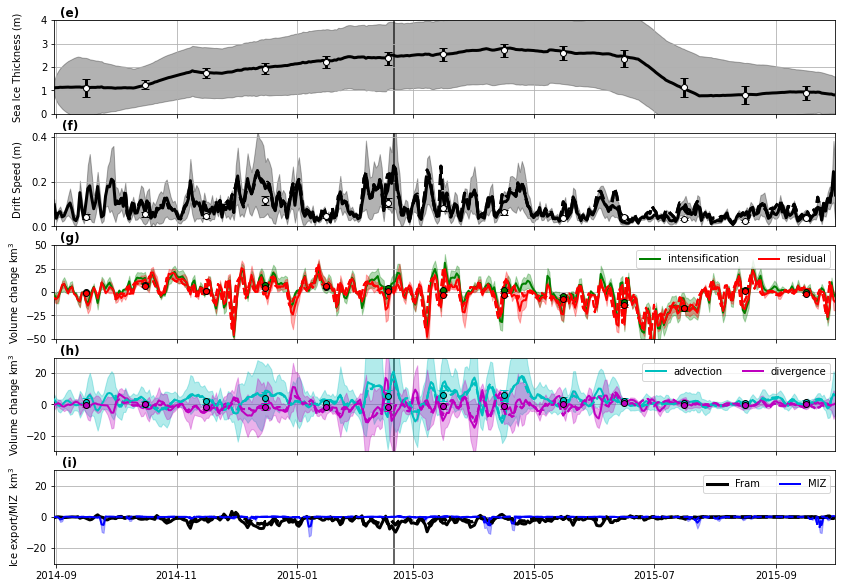

In [277]:
f

In [275]:
save_dir

'/Users/h/PREMELT/Budget/Outputs/Outputs_2022_08_25/out_Pathfinder_nt_Bristol_full_smooth/'

In [766]:
from matplotlib.backends.backend_agg import FigureCanvasAgg 
###### Dailies full time
### CUSTOM region using Fram area map projection
### mask called testm
### plotting only ANIMATION version
dtemp_temp = copy.copy(dtemp)
def lines_now(tp):
    dtemp = dtemp_temp[:tp]
    years=[]
    line_colors=[]
    t_set=[]
    line_labels = []
    show_plot = True
    plot_type='.pdf'
    plot_label = 'Full_time_bud_daily_'
    mlabel_step = 3
    extend_div= False
    mstart = 9
    nmonths = 12
    nrows = 3
    ydim = 10
    pscale = 1e-9
    ts = bud1.dates[0]
    te = bud1.dates[-1]
    minmax_d = [-25,25]
    axlist_d = []
#     bud1.mask=False
#     bud1.build_static_mask(testm)
    #     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
    #               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
    #                         )
    #     pscale = 1e-12*60*60*24
    f= plt.figure(figsize=(14,ydim))
    canvas = FigureCanvasAgg(f)
    #### first plot, big variables
    #     ax = f.add_subplot(nrows,1,1)
    ax = plt.subplot2grid((5,5),(0,0),colspan=5) ## THickness
    # bud1.set_var('thickness')
    # dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='mean',mask=True)
    plot_temp = all_plot_data[0][0][:tp]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'k',marker='',linewidth = 3,zorder=3)#,
    # bud1.set_var('Vol_sig')
    # bud1.data = np.sqrt(bud1.data)
    # dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True)
    # plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    # plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2p = all_plot_data[0][1][:tp]
    plot_temp_s2m = all_plot_data[0][2][:tp]
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)
    ax.set_ylabel('Sea Ice Thickness (m)')
    ax.yaxis.set_label_coords(-.04, .5)
    ax.set_xlim([ts,te])
    ax.set_ylim([0,4])
    ax.xaxis.set_ticklabels([])
    ax.grid(True,zorder=-1.0)

    ax = plt.subplot2grid((5,5),(1,0),colspan=5) ## THickness
    # bud1.data = np.hypot(bud1.ice_drift_x,bud1.ice_drift_y)
    # dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='mean',mask=True)
    plot_temp = all_plot_data[1][0][:tp]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'k',marker='',linewidth = 3,zorder=3)#,
    # bud1.data = np.hypot(bud1.U_sig,bud1.V_sig)
    # bud1.data = np.sqrt(bud1.data)
    # dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True)
    # plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    # plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2p = all_plot_data[1][1][:tp]
    plot_temp_s2m = all_plot_data[1][2][:tp]
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'k',alpha=0.3,zorder=1)
    ax.set_ylabel('Drift Speed (m)')
    ax.yaxis.set_label_coords(-.04, .5)
    ax.set_xlim([ts,te])
    ax.xaxis.set_ticklabels([])
    ax.set_ylim([0,0.42])
    ax.grid(True,zorder=-1.0)

    ax = plt.subplot2grid((5,5),(2,0),colspan=5)
    for n, (var,var_s, cl) in enumerate(zip(['intensification','residual'][:],
                                            ['int_sig','res_sig'],['g','r'])):
    #     bud1.set_var(var)
    #         bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    #     dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
    #                                       year_set = years,
    #                                     mult_array=G.xdist*G.ydist*pscale)
        ## S/N method
    #     b_signal = bud1.data.copy()
    #     bud1.set_var(var_s)
    #     bud1.data = np.abs(b_signal)/np.sqrt(bud1.data)
    #     bud1.data[np.isinf(bud1.data)] = np.nan
    #     dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True,
    #                                       year_set = years)
    #         bud1.set_var(var_s)
    #         bud1.data = np.sqrt(bud1.data)
    # #         bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    #         dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='sum',mask=True,
    #                                           year_set = years,
    #                                         mult_array=G.area*pscale)
        plot_temp = all_plot_data[2+n][0][:tp]
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
    # plt.plot_date(dtemp,np.array(plot_temp2)*(1-1/np.array(plot_temp)),'-r')
    #         plot_temp_s2 = [p+np.sqrt(ps) for p,ps in zip(plot_temp,plot_temp_s)]
        #### normal sig
    #         plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    #         plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
        # S/N
    #     plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    #     plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    #         l, = ax.plot_date(dtemp,plot_temp_s2m,linestyle='--',color = cl,marker='',linewidth = 1)#,
        plot_temp_s2p = all_plot_data[2+n][1][:tp]
        plot_temp_s2m = all_plot_data[2+n][2][:tp]
        ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)
    ax.legend(ncol=2)
    ax.set_ylabel('Volume change km$^3$')
    ax.yaxis.set_label_coords(-.04, .5)
    # ax.xaxis.set_ticks(octs_dt)
    ax.xaxis.set_ticklabels([])
    ax.set_xlim([ts,te])
    ax.set_ylim([-40,40])
    ax.grid(True,zorder=-1.0)
    ax.set_axisbelow(True)

    #### second is dynamics
    #     ax = f.add_subplot(nrows,1,2)
    ax = plt.subplot2grid((5,5),(3,0),colspan=5)
    for n, (var, var_s, cl) in enumerate(zip(['advection','divergence','dynamics'][:2],
                                             ['adv_sig','div_sig','dyn_sig'],['c','m','g'])):
        axlist_d.append(ax)
    #     bud1.set_var(var)
    #     bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    #     dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
    #                                       year_set = years,
    #                                     mult_array=G.xdist*G.ydist*pscale)
        ## S/N method
    #     b_signal = bud1.data.copy()
    #     bud1.set_var(var_s)
    #     bud1.data = np.abs(b_signal)/np.sqrt(bud1.data)
    #     bud1.data[np.isinf(bud1.data)] = np.nan
    #     dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='mean',mask=True,
    #                                       year_set = years)
    #     bud1.set_var(var_s)
    #     bud1.data = np.sqrt(bud1.data)
    #     bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    #     dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='sum',mask=True,
    #                                       year_set = years,
    #                                     mult_array=G.area*pscale)
        plot_temp = all_plot_data[4+n][0][:tp]
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 2,label=var,zorder=3)#,
    #     plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    #     plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    #     ## S/N
    #     plot_temp_s2p = [p+(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    #     plot_temp_s2m = [p-(p/ps) for p,ps in zip(plot_temp,plot_temp_s)]
    # #         l, = ax.plot_date(dtemp,plot_temp_s2,linestyle='--',color = cl,marker='',linewidth = 1)#,
    #     minmax_d[1] = np.maximum(minmax_d[1],np.nanmax(plot_temp_s2p))
    #     minmax_d[0] = np.minimum(minmax_d[0],np.nanmin(plot_temp_s2p))
        plot_temp_s2p = all_plot_data[4+n][1][:tp]
        plot_temp_s2m = all_plot_data[4+n][2][:tp]
        ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = cl,alpha=0.3,zorder=1)

    ax.legend(ncol=2)
    ax.set_ylabel('Volume km$^3$')
    ax.yaxis.set_label_coords(-.04, .5)
    # ax.xaxis.set_ticks(octs_dt)
    ax.xaxis.set_ticklabels([])
    ax.set_xlim([ts,te])
    ax.grid(True,zorder=-1.0)
    ax.set_axisbelow(True)
    # #### all the gates too
    # clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    # #     ax = f.add_subplot(3,1,3)
    ax = plt.subplot2grid((5,5),(4,0),colspan=5)
    axlist_d.append(ax)
    rg['gates']
    gsum = []
    all_gates_all = []
    all_gates_s = []
    # for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
    gl = Gate_data1[0]
    gls = 1.0
    cl = 'k'
    ### for each sum all gates
    gl.set_var('transport_y')
    # bud1.data *= np.array(bud1.days_per_slice)[:,None,None]
    # dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
    #                                   year_set = years,
    #                            mult_array=gls*gl.G.xdist*pscale/2)
    plot_temp = all_plot_data[6][0][:tp]
    l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
                      marker='',linewidth= 3,label=gl.name,zorder=3)
    lines.append(l)
    # all_gates_all.append(plot_temp)
    # gl.set_var('trans_y_sig')
    # gl.data = np.sqrt(gl.data)
    # dtemp,plot_temps = gl.mean_series(method='sum',time_set=t_set,
    #                                   year_set = years,
    #                             mult_array=gls*gl.G.xdist*pscale/2)
    # #         plt.errorbar([gcen[2*gn],gcen[2*gn+1]],plot_temp,fmt='.k',markersize=0,
    # #                      yerr=plot_temps,ecolor='k',capsize=4)
    #     all_gates_s.append(plot_temps)
    # l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '-',color = 'k',
    #                   marker='',linewidth= 2,label = 'All gates')
    # #     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0)-np.nansum(all_gates_s,axis = 0),
    # #                       linestyle = '--',color = 'k',marker='',
    # #                       linewidth= 1)
    # #     l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0)+np.nansum(all_gates_s,axis = 0),
    # #                       linestyle = '--',color = 'k',marker='',
    # #                       linewidth= 1)
    # aga_sp = np.nansum(all_gates_all,axis = 0)+np.nansum(all_gates_s,axis = 0)
    # aga_sm = np.nansum(all_gates_all,axis = 0)-np.nansum(all_gates_s,axis = 0)
    # ax.fill_between(dtemp,aga_sp,aga_sm,
    #                         color = 'k',alpha=0.3,zorder=1)

    # bud1.set_var('MIZ')
    # bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    # dtemp,plot_temp = bud1.mean_series(time_set=t_set,method='sum',mask=True,
    #                                   year_set = years,
    #                                 mult_array=G.xdist*G.ydist*pscale)
    # bud1.set_var('int_t')
    # bud1.data *= np.array(bud1.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
    # dtemp,plot_temp_s = bud1.mean_series(time_set=t_set,method='sum',mask=True,
    #                                   year_set = years,
    #                                 mult_array=G.area*pscale)
    plot_temp = all_plot_data[7][0][:tp]
    l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = 'b',marker='',linewidth = 2,label='MIZ',zorder=3)#,
    #     ax.legend(lines,['Mean']+line_labels)
    # plot_temp_s2p = [p+ps for p,ps in zip(plot_temp,plot_temp_s)]
    # plot_temp_s2m = [p-ps for p,ps in zip(plot_temp,plot_temp_s)]
    plot_temp_s2p = all_plot_data[7][1][:tp]
    plot_temp_s2m = all_plot_data[7][2][:tp]
    # minmax_d[1] = np.maximum(minmax_d[1],np.nanmax(plot_temp_s2p))
    # minmax_d[0] = np.minimum(minmax_d[0],np.nanmin(plot_temp_s2p))
    ax.fill_between(dtemp,plot_temp_s2p,plot_temp_s2m,color = 'b',alpha=0.3,zorder=1)
    ax.set_ylabel('Ice export/MIZ  km$^3$')
    ax.yaxis.set_label_coords(-.04, .5)
    ax.legend(ncol=3)
    ax.grid(True,zorder=-1.0)
    ax.set_xlim([ts,te])
    # ax.xaxis.set_ticks(octs_dt)
    ax.set_axisbelow(True)
    # ax.xaxis.set_ticklabels([odt.strftime('%b-%Y') for odt in octs_dt])
    #         ax.legend(lines)
    #     ax.set_title(gl.name)
    #     ax.axes.set_xlim([0,nmonths-1])
    for ax in axlist_d: 
        ax.set_ylim(minmax_d)
        
    canvas.draw()
    s, (width, height) = canvas.print_to_buffer()

# Option 2a: Convert to a NumPy array.
    image = np.fromstring(s, np.uint8).reshape((height, width, 4))
    i_m,i_n,iii = image.shape
    ### remove outer x%
    cl_p = 0.07
    m_cl = int(i_m*cl_p)
    n_cl = int(i_n*cl_p)
    image = image[m_cl:-m_cl+10,n_cl:-n_cl,:]
    plt.close()
    return image



In [769]:
bud1.n_t

397

In [773]:
## images = []
for tp in range(2,bud1.n_t):
    image = lines_now(tp)
    images.append(image)

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:251: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead


In [774]:
import imageio
fps_set = 2
imageio.mimsave('Daily_lines_2015_FRAM.gif', images, fps=fps_set)
imageio.mimsave('Daily_lines_2015_FRAM.mp4', images, fps=fps_set)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (868, 630) to (880, 640) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [819]:
help(f.suptitle)

Help on method suptitle in module matplotlib.figure:

suptitle(t, **kwargs) method of matplotlib.figure.Figure instance
    Add a centered title to the figure.
    
    Parameters
    ----------
    t : str
        The title text.
    
    x : float, default 0.5
        The x location of the text in figure coordinates.
    
    y : float, default 0.98
        The y location of the text in figure coordinates.
    
    horizontalalignment, ha : {'center', 'left', right'}, default: 'center'
        The horizontal alignment of the text relative to (*x*, *y*).
    
    verticalalignment, va : {'top', 'center', 'bottom', 'baseline'}, default: 'top'
        The vertical alignment of the text relative to (*x*, *y*).
    
    fontsize, size : default: :rc:`figure.titlesize`
        The font size of the text. See `.Text.set_size` for possible
        values.
    
    fontweight, weight : default: :rc:`figure.titleweight`
        The font weight of the text. See `.Text.set_weight` for possible
  

In [1227]:
i,j = 11,1
ur,vr = G2Gplot.rg_vecs(bud1.ice_drift_x[t],bud1.ice_drift_y[t])
ur[i,j] = 0.5
vr[i,j] = 0.0


from matplotlib.backends.backend_agg import FigureCanvasAgg 
t = 170
def map_now(t):
    ur,vr = G2Gplot.rg_vecs(bud1.ice_drift_x[t],bud1.ice_drift_y[t])
    ur[i,j] = 0.5
    vr[i,j] = 0.0
    axs=[]
    f = plt.figure(figsize=[10,12])
    canvas = FigureCanvasAgg(f)
    for pn in range(4):
        ax = f.add_subplot(2,2,pn+1,projection=m) 
        axs.append(ax)
        ax.set_extent(G.x_extent, m)
        ax.set_extent(NFram_rg, m)

    # ax.plot(NFram_rg[0],NFram_rg[1],'*r')
    # ax.plot(Gates_list[0][0].xpts,Gates_list[0][0].ypts,'-k')
    sp = axs[0].pcolormesh(G.xptp,G.yptp,bud1.thickness[t],
                       cmap = plt.cm.tab20c,vmin = 0.0,vmax = 5.0)
    cax = plt.colorbar(sp,orientation='horizontal',ax=axs[0],extend='max',shrink=0.99,pad=0.03)
    cax.set_label('Thickness (m)')

    sp = axs[1].pcolormesh(G.xptp,G.yptp,bud1.intensification[t],
                       cmap = plt.cm.RdBu,vmin = -0.2,vmax = 0.2)
    cax = plt.colorbar(sp,orientation='horizontal',ax=axs[1],extend='both',shrink=0.99,pad=0.03)
    cax.set_label('Intensification (m/day)')

    sp = axs[2].pcolormesh(G.xptp,G.yptp,bud1.advection[t],
                       cmap = plt.cm.RdBu,vmin = -0.2,vmax = 0.2)
    cax = plt.colorbar(sp,orientation='horizontal',ax=axs[2],extend='both',shrink=0.99,pad=0.03)
    cax.set_label('Advection (m/day)')

    sp = axs[3].pcolormesh(G.xptp,G.yptp,bud1.divergence[t],
                       cmap = plt.cm.RdBu,vmin = -0.2,vmax = 0.2)
    cax = plt.colorbar(sp,orientation='horizontal',ax=axs[3],extend='both',shrink=0.99,pad=0.03)
    cax.set_label('Divergence (m/day)')

    for pn in range(4):
        axs[pn].add_feature(cfeature.COASTLINE)
        axs[pn].plot(Gates_list[0][0].x_border[:,0],Gates_list[0][0].x_border[:,1],'-k')
        axs[pn].quiver(Gplot.xpts,Gplot.ypts,ur,vr,
                 scale_units = 'width',scale=1/0.4)
        axs[pn].text(Gplot.xpts[i,j],Gplot.ypts[i,j],'0.5 m/s',
                     verticalalignment='top',fontsize=12)

    plt.subplots_adjust(hspace=0.00,wspace=0.02)
    f.suptitle('Fram Strait Region Volume budget '+bud1.dates[t].strftime('%d-%m-%Y'),y=0.90)
#     f.savefig(save_dir+'FRAM_strait_'+bud1.dates[t].strftime('%d-%m-%Y')+'.png',bbox_inches='tight')
#     plt.show()
    canvas.draw()
    s, (width, height) = canvas.print_to_buffer()

# Option 2a: Convert to a NumPy array.
    image = np.fromstring(s, np.uint8).reshape((height, width, 4))
    i_m,i_n,iii = image.shape
    ### remove outer x%
    cl_p = 0.08
    m_cl = int(i_m*cl_p)
    n_cl = int(i_n*cl_p)
    image = image[m_cl:-m_cl-15,n_cl:-n_cl,:]
    plt.close()
    return image
#     return f


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.
  This is separate from the ipykernel package so we can avoid doing imports until


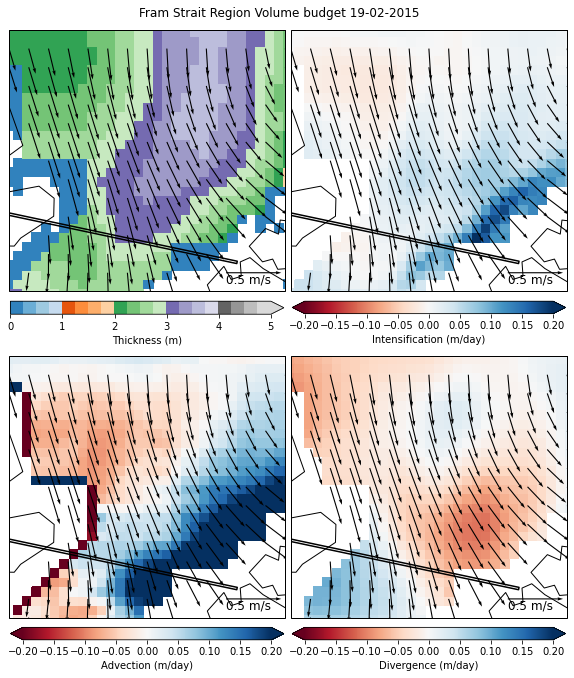

In [1225]:
t = 172
f = map_now(t)
f.show()
# f.savefig()
f.savefig(save_dir+'FRAM_strait_'+bud1.dates[1].strftime('%d-%m-%Y')+'.png',bbox_inches='tight')

In [1229]:
images = []
for tp in range(2,bud1.n_t):
# # for tp in range(102,143):
# for tp in range(102,103):
    image = map_now(tp)
    images.append(image)
# plt.imshow(images[0])

/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:60: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:60: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:60: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:60: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use frombuffer instead
/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:60: DeprecationWarning: The binary mode of fromstring is deprecated, as it behaves surprisingly on unicode inputs. Use

In [1231]:
import imageio
fps_set = 2
# imageio.mimsave('Daily_lines_2015_FRAM.gif', images, fps=fps_set)
# imageio.mimsave('Daily_lines_2015_FRAM.mp4', images, fps=fps_set)
# imageio.mimsave('Daily_maps_2015_FRAM.gif', images, fps=fps_set)
imageio.mimsave('Daily_maps_2015_FRAM.mp4', images, fps=fps_set)

IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (606, 711) to (608, 720) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).


In [1014]:
[rg['label'] for rg in regions]
rg = regions[3]
bud1.mask = False
rg_int= rg['N_ints']
bud1.build_static_mask(
    np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))

Building new mask array


In [1050]:

bud1.set_var('divergence')
dtemp,div_temp = bud1.mean_series(method='sum',mask=True,
                                  year_set = years,
                                mult_array=G.xdist*G.ydist*pscale)
bud1.set_var('advection')
dtemp,adv_temp = bud1.mean_series(method='sum',mask=True,
                                  year_set = years,
                                mult_array=-G.xdist*G.ydist*pscale)
bud1.set_var('MIZ')
dtemp,miz_temp = bud1.mean_series(method='sum',mask=True,
                                  year_set = years,
                                mult_array=G.xdist*G.ydist*pscale)
all_gates_all = []
years = []
for gl,gls in zip(rg['gates'],rg['gates_sign']):
    ### for each sum all gates
#     t_set = [3,397]
    gl.set_var('transport_y')
    dtemp,plot_temp = gl.mean_series(method='sum',#time_set=t_set,
                                      year_set = years,
                               mult_array=gls*gl.G.xdist*pscale/2)
    all_gates_all.append(plot_temp)

Building new mask array
[-2.50636793 -0.05444765  1.13020455]
Basin
0.9050751066560908
0.8419538763130596
-0.03374679765552923
0.022774333664892076
Building new mask array
[-2.50636793 -0.05444765  1.13020455]
Beaufort_Chukchi
0.5781727615712381
0.6174203351066063
0.8474863401751679
0.7843016592551352
Building new mask array
[-2.50636793 -0.05444765  1.13020455]
Siberian_Laptev_Kara
0.9022490592752589
0.5947660259173061
0.14193593105207156
0.31013814943934426
Building new mask array
[-2.50636793 -0.05444765  1.13020455]
Central
0.8467774522479434
0.774246478737449
0.2725646747209014
0.26709125003324474


/Users/h/.local/lib/python3.6/site-packages/ipykernel_launcher.py:80: UserWarning: Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.


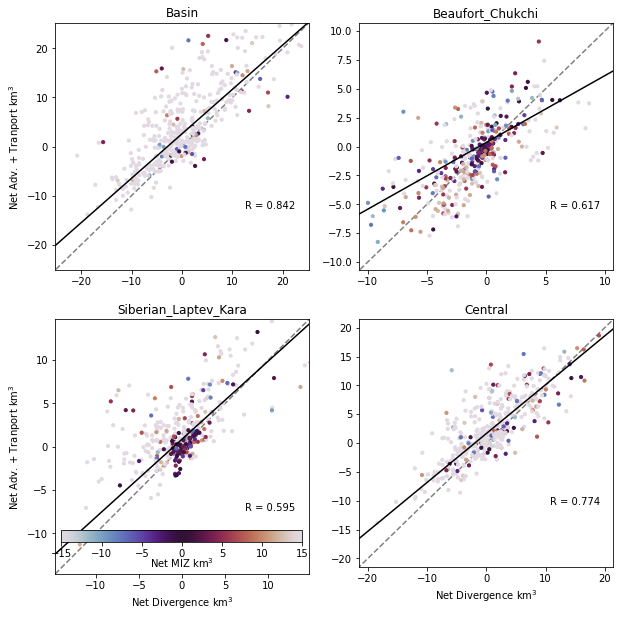

In [1187]:
fig = plt.figure(figsize=(10,10))
for nr,rg in enumerate(regions[:4]): ### 4 regions
    ax = fig.add_subplot(2,2,nr+1)
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    bud1.set_var('divergence')
    dtemp,div_temp = bud1.mean_series(method='sum',mask=True,
                                      year_set = years,
                                    mult_array=G.xdist*G.ydist*pscale)
    bud1.set_var('advection')
    dtemp,adv_temp = bud1.mean_series(method='sum',mask=True,
                                      year_set = years,
                                    mult_array=-G.xdist*G.ydist*pscale)
#     bud1.set_var('MIZ')
#     dtemp,miz_temp = bud1.mean_series(method='sum',mask=True,
#                                       year_set = years,
#                                     mult_array=G.xdist*G.ydist*pscale)
#     bud1.set_var('concentration')
#     dtemp,cnc_temp = bud1.mean_series(method='sum',mask=True,
#                           year_set = years,
#                               mult_array = np.ones(G.shape)/np.sum(bud1.mask[0]))
    bud1.set_var('intensification')
    dtemp,cnc_temp = bud1.mean_series(method='sum',mask=True,
                          year_set = years,
                              mult_array = G.area*pscale)
    all_gates_all = []
    years = []
    for gl,gls in zip(rg['gates'],rg['gates_sign']):
        ### for each sum all gates
    #     t_set = [3,397]
        gl.set_var('transport_y')
        dtemp,plot_temp = gl.mean_series(method='sum',#time_set=t_set,
                                          year_set = years,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        all_gates_all.append(plot_temp)
    
    ax.set_title(rg['label'])
    print(np.nanpercentile(miz_temp,[5,50,95]))
    print(rg['label'])
    if np.isin(nr,[0,2]): ax.set_ylabel('Net Adv. + Tranport km$^3$')
    if np.isin(nr,[2,3]): ax.set_xlabel('Net Divergence km$^3$')
    s = ax.scatter(div_temp,adv_temp+np.nansum(all_gates_all,axis=0),
#     s = ax.scatter(div_temp,np.nansum(all_gates_all,axis=0),
#                    c=miz_temp,
#            vmin = -5,vmax=5,cmap=plt.cm.twilight,s=10)
                   c=cnc_temp,
           vmin = -15,vmax=15,cmap=plt.cm.twilight,s=10)
#                    c=cnc_temp,
#            vmin = 0.2,vmax=1.0,cmap=plt.cm.viridis_r,s=10)
    pl_max = np.max(np.abs(ax.get_xlim() + ax.get_ylim()))*0.8
    ax.set_xlim([-pl_max,pl_max])
    ax.set_ylim([-pl_max,pl_max])
    ax.plot([-50,50],[-50,50],'--k',alpha=0.5,zorder=-1)
#     t_msk = [g<2 and g>-2 for m in miz_temp]
    t_msk = [g<2 and m>-2 for g in cnc_temp]
#     t_msk = [g>0.5 for g in cnc_temp]
#     t_msk = [g>0.5 for g in cnc_temp]
    m, b = np.polyfit(np.array(div_temp)[t_msk],
                    (adv_temp+np.nansum(all_gates_all,axis=0))[t_msk],1)
    x = np.arange(-50,50)
    plt.plot(x, m*x+b,'-k')
    print(m)
    m, b = np.polyfit(np.array(div_temp),
                    (adv_temp+np.nansum(all_gates_all,axis=0)),1)
    ax.text(pl_max/2,-pl_max/2,'R = {:.3f}'.format(m))
    print(m)
    m, b = np.polyfit(np.array(div_temp)[t_msk],
                    (np.nansum(all_gates_all,axis=0))[t_msk],1)
    print(m)
    m, b = np.polyfit(np.array(div_temp),
                    (np.nansum(all_gates_all,axis=0)),1)
    print(m)
    if nr == 2: ### colorbar
        cax = plt.colorbar(s, shrink = 0.95,pad=-0.18,orientation = 'horizontal')
        cax.set_label('Net MIZ km$^3$')
        cax.ax.xaxis.set_label_coords(0.5,-1.2)
# plt.scatter(div_temp,np.nansum(all_gates_all,axis=0),s=10)
fig.show()
# fig.savefig(save_dir+'DIV_thm_scatter.pdf',bbox_inches='tight')

Building new mask array
Basin
Data year mask not set: ignoring it


KeyboardInterrupt: 

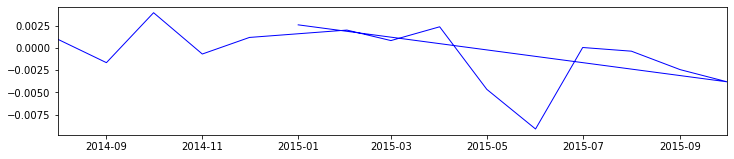

In [705]:
### For dailies only
years=[]
line_colors=[]
t_set=[]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Full_time_bud_exports_'
mlabel_step = 2
extend_div= False
mstart = 9
nmonths = 12
nrows = 3
ydim = 8
pscale = 1e-12
ts = bud.dates[0]
te = bud.dates[-1]
for rg in regions[:]:
    minmax_d = [0.0,0.0]
    axlist_d = []
    bud1.mask=False
    rg_int= rg['N_ints']
    bud1.build_static_mask(
        np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
    print(rg['label'])
#     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24
    mlist = [dt.datetime(2000,1,1) + relativedelta(months = mn) 
         for mn in range(mstart,mstart+nmonths)]
    mstr = [md.strftime('%b') for n,md in enumerate(mlist)]
    for i in range(nmonths):
        if np.mod(i,mlabel_step) != 0:
            mstr[i] = ''
    f= plt.figure(figsize=(12,ydim))
    #### first plot, big variables
    ax = f.add_subplot(nrows,1,1)
    ax.set_xlim([ts,te])
    for n, (var, cl) in enumerate(zip(['intensification','residual'],['b','r'])):
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
    ax.legend()
    ax.set_ylabel('Volume change 10$^6$ km$^3$')
    ax.xaxis.set_ticks([])
    #### second is dynamics
    ax = f.add_subplot(nrows,1,2)
    for n, (var, cl) in enumerate(zip(['divergence','advection','dynamics'],['b','r','m'])):
        axlist_d.append(ax)
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
        minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
        minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))
    
    ax.legend()
    ax.set_ylabel('Volume change 10$^3$ km$^3$')
    ax.xaxis.set_ticks([])
    #### all the gates too
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    ax = f.add_subplot(3,1,3)
    axlist_d.append(ax)
    rg['gates']
    gsum = []
    all_gates_all = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_x')
    # bud.data *= np.array(bud.days_per_slice)[:,None,None]
        dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
                          marker='',linewidth= 1,label=gl.name)
        lines.append(l)
        all_gates_all.append(plot_temp)
    l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '-',color = 'k',
                      marker='',linewidth= 2,label = 'All gates')

    #     ax.legend(lines,['Mean']+line_labels)
    ax.set_ylabel('Ice export 10$^3$ km$^3$')
    ax.legend()
    #         ax.legend(lines)
    #     ax.set_title(gl.name)
#     ax.axes.set_xlim([0,nmonths-1])
    for ax in axlist_d: 
        ax.set_ylim(minmax_d)
        ax.set_xlim([ts,te])
    f.savefig(save_dir+plot_label+'clim_lines'+rg['label']+plot_type,bbox_inches='tight')
    if show_plot: plt.show()

    

In [283]:
### as above but the whole time series - SINGLE REGION ANIMATED
from matplotlib.backends.backend_agg import FigureCanvasAgg 
years=[]
line_colors=[]
t_set=[]
line_labels = []
show_plot = True
plot_type='.pdf'
plot_label = 'Full_time_bud_exports_'
mlabel_step = 2
extend_div= False
mstart = 9
nmonths = 12
nrows = 3
ydim = 8
pscale = 1e-12
rg = regions[0]
# minmax_d = [0.0,0.0]
ts = bud.dates[0]
te = bud.dates[-1]
minmax_d = [-0.6,0.6]
axlist_d = []
bud1.mask=False
rg_int= rg['N_ints']
bud1.build_static_mask(
    np.isin(NG2G.rg_array(Nmask,method='nearest'),rg_int))
print(rg['label'])
#     ba.budget_clim_lines(bud1,9,12,G)#,extend_div=True
#               ,years=[year_plus,year_mins],line_colors=['b','r'],line_labels = ['AO+','AO-']
#                         )
#     pscale = 1e-12*60*60*24
def plot_now(ts,te,d):
    f= plt.figure(figsize=(12,ydim))
    canvas = FigureCanvasAgg(f)
    #### find t_set from ts,d
    t_set = [bud.get_index(du) for du in [ts,d]]
    #### first plot, big variables
    ax = f.add_subplot(nrows,1,1)
    ax.set_title(d.strftime('%b %Y'))
    for n, (var, cl) in enumerate(zip(['intensification','residual'],['b','r'])):
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
    ax.set_xlim([ts,te])
    ax.legend()
    ax.set_ylabel('Volume change 10$^6$ km$^3$')
    ax.xaxis.set_ticks([])
    #### second is dynamics
    ax = f.add_subplot(nrows,1,2)
    for n, (var, cl) in enumerate(zip(['divergence','advection','dynamics'],['b','r','m'])):
        axlist_d.append(ax)
        bud.set_var(var)
        bud.data *= np.array(bud.days_per_slice)[:,None,None]/30 ## convert to monthly growth 
        dtemp,plot_temp = bud.mean_series(time_set=t_set,method='sum',mask=True,
                                        mult_array=G.xdist*G.ydist*pscale)
        l, = ax.plot_date(dtemp,plot_temp,linestyle='-',color = cl,marker='',linewidth = 1,label=var)#,
        minmax_d[0] = np.minimum(minmax_d[0],np.min(plot_temp))
        minmax_d[1] = np.maximum(minmax_d[1],np.max(plot_temp))

    ax.legend()
    ax.set_ylabel('Volume change 10$^6$ km$^3$')
    ax.xaxis.set_ticks([])
    #### all the gates too
    clines = [plt.cm.jet(int(p)) for p in np.linspace(0,256,len(rg['gates']))]
    ax = f.add_subplot(3,1,3)
    axlist_d.append(ax)
    rg['gates']
    gsum = []
    all_gates_all = []
    for gl,gls,cl in zip(rg['gates'],rg['gates_sign'],clines):
        ### for each sum all gates
        gl.set_var('transport_x')
    # bud.data *= np.array(bud.days_per_slice)[:,None,None]
        dtemp,plot_temp = gl.mean_series(method='sum',time_set=t_set,
                                   mult_array=gls*gl.G.xdist*pscale/2)
        l, = ax.plot_date(dtemp,plot_temp,linestyle = '-',color = cl,
                          marker='',linewidth= 1,label=gl.name)
        lines.append(l)
        all_gates_all.append(plot_temp)
    l, = ax.plot_date(dtemp,np.nansum(all_gates_all,axis = 0),linestyle = '-',color = 'k',
                      marker='',linewidth= 2,label = 'All gates')

    #     ax.legend(lines,['Mean']+line_labels)
    ax.set_ylabel('Ice export 10$^3$ km$^3$')
    ax.legend()
    #         ax.legend(lines)
    #     ax.set_title(gl.name)
    #     ax.axes.set_xlim([0,nmonths-1])
    for ax in axlist_d: 
        ax.set_ylim(minmax_d)
        ax.set_xlim([ts,te])
#     f.savefig(save_dir+plot_label+'clim_lines'+rg['label']+plot_type,bbox_inches='tight')
#     if show_plot: plt.show()
    
    canvas.draw()
    s, (width, height) = canvas.print_to_buffer()

# Option 2a: Convert to a NumPy array.
    image = np.fromstring(s, np.uint8).reshape((height, width, 4))
    i_m,i_n,iii = image.shape
    ### remove outer x%
    cl_p = 0.09
    m_cl = int(i_m*cl_p)
    n_cl = int(i_n*cl_p)
    image = image[m_cl:-m_cl+10,n_cl:-n_cl,:]
    plt.close()
    return image



Building new mask array
Basin
